# Compound's classification based on their SMILES representation
#### qHTS for Inhibitors of human tyrosyl-DNA phosphodiesterase 1 (TDP1): qHTS in cells in absence of CPT

## Etapa 1 e 2

### Carla Rafaela Silva, pg42862; José Pereira, pg42871; Tiago Silva, pg42885.

## Introduction
Human tyrosyl-DNA phosphodiesterase 1 (TDP1) is a novel repair gene, and we propose to use it as a new target for anticancer drug development. TDP1 is not an essential protein, but under treatment with topoisomerase I poison (camptothecin: CPT), TDP1 works as a critical factor for cell survival. To directly identify novel TDP1 inhibitors active in a cellular environment, we have knocked-out the Tdp1 gene in chicken DT40 cells (Tdp1-/-) and generated a complemented counterpart cells that contains a stable transfection of the human TDP1 gene (Tdp1-/-;hTDP1 cells). For the primary screen, Tdp1-/-;hTDP1 cells will be exposed to small molecules in the presence or absence of CPT, and their growth kinetics will be evaluated after 48 hours by measuring ATP activity. If a given compound shows a synergistic effect with CPT, this compound could inhibit the repair pathway of CPT-induced lesions including the TDP1-mediated repair pathway. The hit compounds will then be evaluated in the presence or absence of CPT using Tdp1-/- cells. If a compound shows synergistic effect with CPT in Tdp1-/-;hTDP1 cells, but not with Tdp1-/- cells, such compound could be involved in the TDP1-mediated repair pathway inhibition. In tertiary assays, biochemical gel-based assays will be used to assess whether the hit compounds specifically target TDP1.

## Imports

In [1]:
import sys
import copy
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem, DataStructs
from rdkit.ML.Descriptors import MoleculeDescriptors
from rdkit.Chem import Descriptors
from loaders.Loaders import CSVLoader
from standardizer.CustomStandardizer import CustomStandardizer
from scalers.sklearnScalers import StandardScaler
from compoundFeaturization.rdkitDescriptors import TwoDimensionDescriptors
from compoundFeaturization.rdkitFingerprints import MorganFingerprint, RDKFingerprint, MACCSkeysFingerprint
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from boruta.boruta_py import BorutaPy
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectPercentile

%matplotlib inline
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

sys.path.append('src')

## Initial exploration

### Import dataset
The first step, analysing this dataset, includes loading and displaying TDP1 data.

In [2]:
file = '../dataset/TDP1_activity_dataset.csv'
dataset = pd.read_csv(file, sep=',')
dataset.head()

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,Efficacy,Analysis Comment,Activity_Score,Curve_Description,Fit_LogAC50,Fit_HillSlope,Fit_R2,Fit_InfiniteActivity,Fit_ZeroActivity,Fit_CurveClass,Excluded_Points,Max_Response,Activity at 0.0000295000 uM,Activity at 0.0000590000 uM,Activity at 0.0001503265 uM,Activity at 0.0002712146 uM,Activity at 0.0005895491 uM,Activity at 0.00117 uM,Activity at 0.00179 uM,Activity at 0.00299 uM,Activity at 0.00672 uM,Activity at 0.014 uM,Activity at 0.026 uM,Activity at 0.040 uM,Activity at 0.074 uM,Activity at 0.167 uM,Activity at 0.363 uM,Activity at 0.628 uM,Activity at 0.975 uM,Activity at 1.849 uM,Activity at 4.119 uM,Activity at 9.037 uM,Activity at 15.83 uM,Activity at 21.08 uM,Activity at 46.23 uM,Activity at 92.54 uM,Activity at 165.6 uM,Compound QC,smiles
0,1,109967258.0,50897788.0,Active,42.0,http://assay.nih.gov/htsws/rest/display/dd-tdp...,NaN,Inhibitor,14.1254,136.5470,NaN,42.0,Partial curve - high efficacy,-4.850,1.0100,0.9948,-134.4880,2.0597,-2.1,0 0 0 0 0,-106.3110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0597,NaN,NaN,NaN,NaN,0.5007,NaN,NaN,-17.4373,NaN,-48.5138,NaN,NaN,-106.3110,NaN,NaN,QC'd by AA Pharmaceuticals,CNCC1=NC2=C(C=C(C=C2)Cl)C(=N1)C3=CC=CN3
1,2,144206324.0,65628.0,Active,41.0,http://assay.nih.gov/htsws/rest/display/dd-tdp...,NaN,Inhibitor,18.8375,82.1468,NaN,41.0,Partial curve - high efficacy,-4.725,1.9887,0.9829,-82.6097,-0.4629,-2.1,0 0 0 0 0 0 0 0,-70.9545,NaN,NaN,NaN,NaN,-3.2819,NaN,NaN,1.1641,NaN,5.8554,NaN,NaN,-1.8326,NaN,-4.9853,NaN,NaN,0.0798,NaN,-16.3921,NaN,NaN,-70.9545,NaN,NaN,QC'd by ACC,CN1C2=C(C=C(C=C2)N(CCCl)CCCl)N=C1CCCC(=O)O
2,7,144206329.0,92140.0,Active,82.0,http://assay.nih.gov/htsws/rest/display/dd-tdp...,NaN,Inhibitor,5.9569,61.9164,NaN,82.0,Complete curve - high efficacy,-5.225,4.5045,0.9691,-60.9817,0.9346,-1.1,0 0 0 0 0 0 0 0,-61.0446,NaN,NaN,NaN,NaN,-2.4216,NaN,NaN,-0.2644,NaN,-3.0684,NaN,NaN,11.8298,NaN,-2.8736,NaN,NaN,1.3237,NaN,-53.7786,NaN,NaN,-61.0446,NaN,NaN,QC'd by ACC,CCCC(=O)OC[C@H]([C@H]([C@H](CN1C2=C(C=C(C(=C2)...
3,16,144206459.0,148121.0,Active,94.0,http://assay.nih.gov/htsws/rest/display/dd-tdp...,NaN,Inhibitor,0.0237,97.3845,NaN,94.0,Complete curve - high efficacy,-7.625,2.4064,0.9971,-92.6583,4.7262,-1.1,0 0 0 0 0 0 0 0,-95.5529,NaN,NaN,NaN,NaN,7.8276,NaN,NaN,0.4451,NaN,-18.2129,NaN,NaN,-88.3851,NaN,-91.2719,NaN,NaN,-90.9857,NaN,-90.6026,NaN,NaN,-95.5529,NaN,NaN,QC'd by ACC,C#CCC(CC1=CN=C2C(=N1)C(=NC(=N2)N)N)C3=CC=C(C=C...
4,17,144206460.0,56840936.0,Active,97.0,http://assay.nih.gov/htsws/rest/display/dd-tdp...,NaN,Inhibitor,0.0013,86.9215,NaN,97.0,Complete curve - high efficacy,-8.875,4.0950,0.9961,-77.2253,9.6962,-1.1,0 0 0 0 0 0 0 0,-80.1864,NaN,NaN,NaN,NaN,6.9054,NaN,NaN,-73.9506,NaN,-73.9684,NaN,NaN,-76.0608,NaN,-76.3008,NaN,NaN,-77.0758,NaN,-78.7580,NaN,NaN,-80.1864,NaN,NaN,QC'd by ACC,C/C=C\1/C(=O)NC(C(=O)O[C@H]\2CC(=O)N[C@@H](C(=...


### Simple Analyses
This following step was taken to analyse how data presents itself along the lines and columns of the dataset.

In [3]:
dataset.size

1920000

In [4]:
dataset.shape

(40000, 48)

This dataset was loaded under the name 'dataset'. It has 40,000 distinct molecules and 48 variables. In total, there are 1,920,000 data entries.

In [5]:
dataset.columns

Index(['PUBCHEM_RESULT_TAG', 'PUBCHEM_SID', 'PUBCHEM_CID',
       'PUBCHEM_ACTIVITY_OUTCOME', 'PUBCHEM_ACTIVITY_SCORE',
       'PUBCHEM_ACTIVITY_URL', 'PUBCHEM_ASSAYDATA_COMMENT', 'Phenotype',
       'Potency', 'Efficacy', 'Analysis Comment', 'Activity_Score',
       'Curve_Description', 'Fit_LogAC50', 'Fit_HillSlope', 'Fit_R2',
       'Fit_InfiniteActivity', 'Fit_ZeroActivity', 'Fit_CurveClass',
       'Excluded_Points', 'Max_Response', 'Activity at 0.0000295000 uM',
       'Activity at 0.0000590000 uM', 'Activity at 0.0001503265 uM',
       'Activity at 0.0002712146 uM', 'Activity at 0.0005895491 uM',
       'Activity at 0.00117 uM', 'Activity at 0.00179 uM',
       'Activity at 0.00299 uM', 'Activity at 0.00672 uM',
       'Activity at 0.014 uM', 'Activity at 0.026 uM', 'Activity at 0.040 uM',
       'Activity at 0.074 uM', 'Activity at 0.167 uM', 'Activity at 0.363 uM',
       'Activity at 0.628 uM', 'Activity at 0.975 uM', 'Activity at 1.849 uM',
       'Activity at 4.119 uM', 'Ac

| ColumnsName | Description |
| :-: | :-: |
| **PUBCHEM_RESULT_TAG** | This column contains an increasing number starting from one. |
| **PUBCHEM_SID** | PubChem SubstanceID |
| **PUBCHEM_CID** | PubChem CompoundID |
| **PUBCHEM_ACTIVITY_OUTCOME** | This field allows the submitter to make an expert judgment call about the activity of each test result. Using a number, the value is set to 1 (inactive) or 2 (active) based on whatever means appropriate. In addition to active/inactive, this field can also be set to 3 (inconclusive), 4 (unspecified) or 5 (probe). The 'probe' designation indicates that the activity of the test result has been tested and confirmed though multiple rounds of experimental inquiry |
| **PUBCHEM_ACTIVITY_SCORE** | The activity of a test result may be assigned a normalized score between 0 and 100 where the most active result rows have scores closer to 100 and inactive closer to 0, so that one can rank the result based on this data and prioritize hits |
| **PUBCHEM_ACTIVITY_URL** | An URL may optionally be provided for Assay Data reported for this Substance in this column. |
| **PUBCHEM_ASSAYDATA_COMMENT** | Textual annotation and comments |
| **Potency** | Concentration at which compound exhibits half-maximal efficacy |
| **Efficacy** | Maximal efficacy of compound, reported as a percentage of control |
| **Analysis Comment** | Annotation/notes on a particular compound's data or its analysis |
| **Activity_Score** | Activity score |
| **Curve_Description** | A description of dose-response curve quality |
| **Fit_LogAC50** | The logarithm of the AC50 from a fit of the data to the Hill equation (calculated based on Molar Units) |
| **Fit_HillSlope** | The Hill slope from a fit of the data to the Hill equation |
| **Fit_R2** | R^2 fit value of the curve. Closer to 1.0 equates to better Hill equation fit |
| **Fit_InfiniteActivity** | The asymptotic efficacy from a fit of the data to the Hill equation |
| **Fit_ZeroActivity** | Efficacy at zero concentration of compound from a fit of the data to the Hill equation |
| **Fit_CurveClass** | Numerical encoding of curve description for the fitted Hill equation |
| **Excluded_Points** | Which dose-response titration points were excluded from analysis based on outlier analysis |
| **Max_Response** | Maximum activity observed for compound (usually at highest concentration tested) |
| **Activity at xx uM*** | % Activity at given concentration |
| **Compound QC** | NCGC designation for data stage: 'qHTS', 'qHTS Verification', 'Secondary Profiling' |
| **smiles** | SMILES (Simplified Molecular Input Line Entry System) is a chemical notation that allows a user to represent a chemical structure in a way that can be used by the computer. |

*Activity at xx uM refers to all columns that shows the activity of a molecule at a certain concentration.

In [6]:
dataset.dtypes

PUBCHEM_RESULT_TAG               int64
PUBCHEM_SID                    float64
PUBCHEM_CID                    float64
PUBCHEM_ACTIVITY_OUTCOME        object
PUBCHEM_ACTIVITY_SCORE         float64
PUBCHEM_ACTIVITY_URL            object
PUBCHEM_ASSAYDATA_COMMENT      float64
Phenotype                       object
Potency                        float64
Efficacy                       float64
Analysis Comment               float64
Activity_Score                 float64
Curve_Description               object
Fit_LogAC50                    float64
Fit_HillSlope                  float64
Fit_R2                         float64
Fit_InfiniteActivity           float64
Fit_ZeroActivity               float64
Fit_CurveClass                 float64
Excluded_Points                 object
Max_Response                   float64
Activity at 0.0000295000 uM    float64
Activity at 0.0000590000 uM    float64
Activity at 0.0001503265 uM    float64
Activity at 0.0002712146 uM    float64
Activity at 0.0005895491 

In [7]:
sub_dataset = dataset[['Potency', 'Efficacy', 'Fit_LogAC50', 'Fit_HillSlope', 'Fit_R2',
       'Fit_InfiniteActivity', 'Fit_ZeroActivity', 'Activity at 0.0000295000 uM',
       'Activity at 0.0000590000 uM', 'Activity at 0.0001503265 uM',
       'Activity at 0.0002712146 uM', 'Activity at 0.0005895491 uM',
       'Activity at 0.00117 uM', 'Activity at 0.00179 uM',
       'Activity at 0.00299 uM', 'Activity at 0.00672 uM',
       'Activity at 0.014 uM', 'Activity at 0.026 uM', 'Activity at 0.040 uM',
       'Activity at 0.074 uM', 'Activity at 0.167 uM', 'Activity at 0.363 uM',
       'Activity at 0.628 uM', 'Activity at 0.975 uM', 'Activity at 1.849 uM',
       'Activity at 4.119 uM', 'Activity at 9.037 uM', 'Activity at 15.83 uM',
       'Activity at 21.08 uM', 'Activity at 46.23 uM', 'Activity at 92.54 uM',
       'Activity at 165.6 uM']]

sub_dataset.describe()

,Potency,Efficacy,Fit_LogAC50,Fit_HillSlope,Fit_R2,Fit_InfiniteActivity,Fit_ZeroActivity,Activity at 0.0000295000 uM,Activity at 0.0000590000 uM,Activity at 0.0001503265 uM,Activity at 0.0002712146 uM,Activity at 0.0005895491 uM,Activity at 0.00117 uM,Activity at 0.00179 uM,Activity at 0.00299 uM,Activity at 0.00672 uM,Activity at 0.014 uM,Activity at 0.026 uM,Activity at 0.040 uM,Activity at 0.074 uM,Activity at 0.167 uM,Activity at 0.363 uM,Activity at 0.628 uM,Activity at 0.975 uM,Activity at 1.849 uM,Activity at 4.119 uM,Activity at 9.037 uM,Activity at 15.83 uM,Activity at 21.08 uM,Activity at 46.23 uM,Activity at 92.54 uM,Activity at 165.6 uM
count,20030.000000,20030.000000,21875.000000,38208.000000,38208.000000,38208.000000,38208.000000,0.0,0.0,2.000000,0.0,271.000000,12.000000,9.000000,38700.000000,32.000000,1692.000000,71.000000,20.000000,1631.000000,35.000000,39770.000000,72.000000,20.000000,39752.000000,49.000000,39199.000000,70.000000,19.000000,39951.000000,39.000000,1.000
mean,14.576385,96.992453,-5.004474,2.976413,0.875302,-55.874923,-2.191756,NaN,NaN,2.403950,NaN,-3.557925,-0.236175,2.232467,-2.767132,-2.647712,-1.030801,-4.937286,-10.547480,-1.734433,-9.168951,-2.917125,-14.621740,-26.719645,-6.285802,-35.887480,-20.573796,-65.681879,-82.776984,-48.314895,-97.438046,-105.182
std,7.230402,21.335634,0.545511,1.482360,0.179660,48.730687,9.992784,NaN,NaN,2.569131,NaN,14.086167,8.757193,4.238672,10.600459,17.535983,11.429548,20.749187,30.000524,12.266283,24.735313,11.712981,31.735548,39.373393,16.480642,41.275706,27.550225,33.244330,22.719253,42.880515,12.009172,NaN
min,0.001300,4.737700,-9.075000,0.200000,0.300300,-171.676000,-126.305000,NaN,NaN,0.587300,NaN,-89.497200,-15.210000,-6.975500,-124.585000,-90.796900,-103.706000,-111.866000,-95.970500,-112.078000,-85.989400,-124.830000,-119.299000,-96.815100,-125.457000,-119.572000,-132.226000,-113.478000,-113.864000,-139.063000,-115.087000,-105.182
25%,9.200000,82.368825,-5.086200,1.788500,0.821400,-100.585000,-6.234325,NaN,NaN,1.495625,NaN,-5.878100,-5.627875,0.451300,-7.230900,-5.573800,-4.143900,-4.231150,-9.629950,-6.042150,-9.907650,-7.091025,-11.366200,-49.816450,-10.339025,-80.854900,-28.189700,-93.357050,-96.417750,-90.493700,-106.898500,-105.182
50%,16.360100,96.297200,-4.786200,2.533400,0.970600,-69.471800,-1.248000,NaN,NaN,2.403950,NaN,-1.091000,-0.126950,4.153200,-1.399500,-0.156150,0.151300,0.791900,-1.193250,-0.630000,0.914600,-1.263200,-0.748300,-5.639950,-2.636400,-13.881800,-13.460600,-82.284000,-86.339000,-38.131100,-98.435600,-105.182
75%,20.596200,111.422250,-4.686200,4.954900,0.993700,-8.455775,2.976475,NaN,NaN,3.312275,NaN,2.372200,2.088900,5.143500,2.597625,2.806800,3.728025,2.627950,3.318550,3.963550,3.415300,2.735700,2.524500,1.053000,1.662550,0.071100,-1.373500,-29.666925,-75.957250,-6.694800,-89.846150,-105.182
max,38.869900,186.037000,-4.410400,4.954900,1.000000,55.568000,46.025900,NaN,NaN,4.220600,NaN,23.740700,18.811200,6.595400,43.627300,26.864900,28.716800,10.887000,19.945900,32.589600,14.611800,40.747500,10.864500,8.709000,50.993300,13.053000,52.388100,-10.046600,-15.421200,44.389300,-64.424900,-105.182


## Pre-Processing

The number of non attributed values (NA's) will be counted.

### Visualization of the NA's

In [8]:
print(dataset.isna().sum())
print(f"TOTAL: {dataset.isna().sum().sum()}")

PUBCHEM_RESULT_TAG                 0
PUBCHEM_SID                        0
PUBCHEM_CID                       18
PUBCHEM_ACTIVITY_OUTCOME           0
PUBCHEM_ACTIVITY_SCORE             0
PUBCHEM_ACTIVITY_URL               0
PUBCHEM_ASSAYDATA_COMMENT      40000
Phenotype                          0
Potency                        19970
Efficacy                       19970
Analysis Comment               40000
Activity_Score                     1
Curve_Description              19955
Fit_LogAC50                    18125
Fit_HillSlope                   1792
Fit_R2                          1792
Fit_InfiniteActivity            1792
Fit_ZeroActivity                1792
Fit_CurveClass                     0
Excluded_Points                 1792
Max_Response                       0
Activity at 0.0000295000 uM    40000
Activity at 0.0000590000 uM    40000
Activity at 0.0001503265 uM    39998
Activity at 0.0002712146 uM    40000
Activity at 0.0005895491 uM    39729
Activity at 0.00117 uM         39988
A

As we can see, there are a few columns that are completly filled by NA's, such as "PUBCHEM_ASSAYDATA_COMMENT" and "Analysis Comment". Therefore, these columns do not provide any type of information to the dataset.
It is import to note that are 10 molecules with missing SMILE.

We can observe that more than 50% of all data entries are NA's.

### Drop specific features

In [9]:
dataset = dataset.dropna(axis=1, how='all')
dataset.drop(['PUBCHEM_ACTIVITY_URL', 'Compound QC'], axis=1)
dataset = dataset[dataset['smiles'].notna()]

print(dataset.shape)
print(dataset.columns)

(39990, 43)
Index(['PUBCHEM_RESULT_TAG', 'PUBCHEM_SID', 'PUBCHEM_CID',
       'PUBCHEM_ACTIVITY_OUTCOME', 'PUBCHEM_ACTIVITY_SCORE',
       'PUBCHEM_ACTIVITY_URL', 'Phenotype', 'Potency', 'Efficacy',
       'Activity_Score', 'Curve_Description', 'Fit_LogAC50', 'Fit_HillSlope',
       'Fit_R2', 'Fit_InfiniteActivity', 'Fit_ZeroActivity', 'Fit_CurveClass',
       'Excluded_Points', 'Max_Response', 'Activity at 0.0001503265 uM',
       'Activity at 0.0005895491 uM', 'Activity at 0.00117 uM',
       'Activity at 0.00179 uM', 'Activity at 0.00299 uM',
       'Activity at 0.00672 uM', 'Activity at 0.014 uM',
       'Activity at 0.026 uM', 'Activity at 0.040 uM', 'Activity at 0.074 uM',
       'Activity at 0.167 uM', 'Activity at 0.363 uM', 'Activity at 0.628 uM',
       'Activity at 0.975 uM', 'Activity at 1.849 uM', 'Activity at 4.119 uM',
       'Activity at 9.037 uM', 'Activity at 15.83 uM', 'Activity at 21.08 uM',
       'Activity at 46.23 uM', 'Activity at 92.54 uM', 'Activity at 165.6 u

3 columns consisting only of NA's were removed, which reduced the dataset to 45 columns in total.
Columns whose information will not be useful for further analysis were also removed. More specifically, the columns "PUBCHEM_ACTIVITY_URL" and "Compound QC" have been removed, reducing the column total to 43.
The 10 molecules that did not have SMILE notation were removed from the dataset.

In [10]:
dataset_1 = pd.DataFrame.copy(dataset)
dataset_1["PUBCHEM_ACTIVITY_OUTCOME"] = dataset_1["PUBCHEM_ACTIVITY_OUTCOME"].replace({"Active":1, "Inactive": 0})
dataset_1.to_csv("../dataset/binary_class/PUBCHEM_ACTIVITY_OUTCOME_binary.csv", index=False)
dataset_1 = None

To help with future analysis, the "PUBCHEM_ACTIVITY_OUTCOME" categorical variable was transformed into a binary variable.

## Graphic Exploration
### Activity_outcome and Phenotype

In [11]:
activity = dataset.groupby('PUBCHEM_ACTIVITY_OUTCOME').size()
labels_activity = dataset.groupby('PUBCHEM_ACTIVITY_OUTCOME').size().index
dataset.groupby('PUBCHEM_ACTIVITY_OUTCOME').size()

PUBCHEM_ACTIVITY_OUTCOME
Active      19992
Inactive    19998
dtype: int64

In [12]:
fenotipo = dataset.groupby('Phenotype').size()
labels_fenotipo = dataset.groupby('Phenotype').size().index
dataset.groupby('Phenotype').size()

Phenotype
Activator       60
Inactive     19938
Inhibitor    19992
dtype: int64

Text(0.5, 1.0, 'Phenotype')

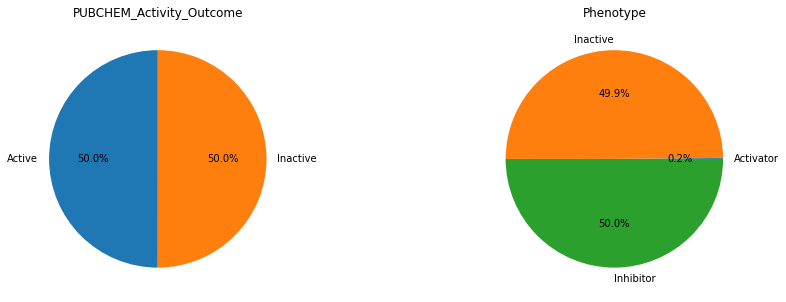

In [13]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.pie(activity, labels=labels_activity, autopct='%1.1f%%', startangle=90)
ax1.set_title('PUBCHEM_Activity_Outcome')
ax2.pie(fenotipo, labels=labels_fenotipo, autopct='%1.1f%%', startangle=360)
ax2.set_title('Phenotype')

As we can see in the "PUBCHEM_Activity_Outcome" pie chart, the data is balanced for binary classification.
In the "Phenotype" pie chart, the overall multiclass is very imbalanced. However, the data is balanced between the 'Inactive' and 'Inhibitor' phenotypes.

### Boxplots of Activity at 0.00299 uM, 0.363 uM, 1.849 uM, 9.037 uM and 46.23 uM

<AxesSubplot:title={'center':'Activity at 0.00299 uM'}, ylabel='Activity at 0.00299 uM'>

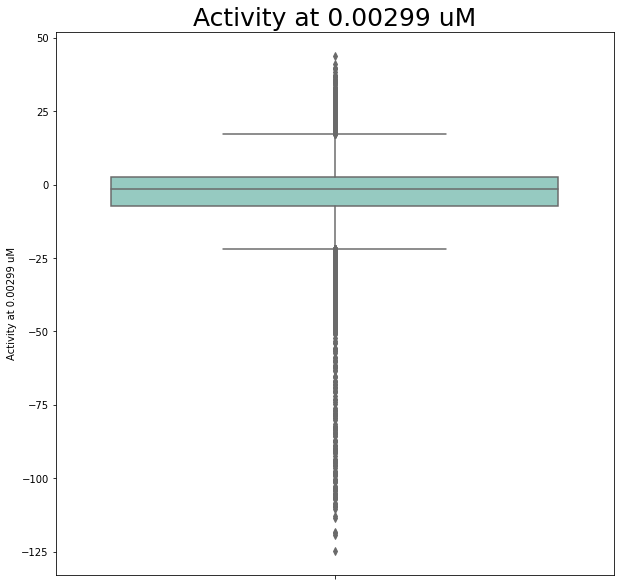

In [14]:
plt.subplots(figsize=(10, 10))
sns.set(font_scale=1.4)
plt.title("Activity at 0.00299 uM", fontsize=25)
sns.boxplot(y="Activity at 0.00299 uM",
            data=dataset, palette="Set3")

In [15]:
dataset["Activity at 0.00299 uM"].describe()

count    38695.000000
mean        -2.765257
std         10.593629
min       -124.585000
25%         -7.230600
50%         -1.400000
75%          2.597650
max         43.627300
Name: Activity at 0.00299 uM, dtype: float64

<AxesSubplot:title={'center':'Activity at 0.363 uM'}, ylabel='Activity at 0.363 uM'>

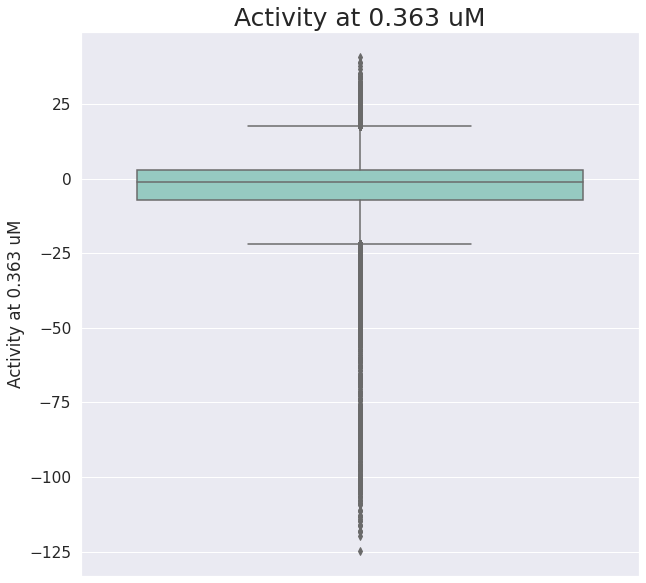

In [16]:
plt.subplots(figsize=(10, 10))
sns.set(font_scale=1.4)
plt.title("Activity at 0.363 uM", fontsize=25)
sns.boxplot(y="Activity at 0.363 uM",
            data=dataset, palette="Set3")

In [17]:
dataset["Activity at 0.363 uM"].describe()

count    39760.000000
mean        -2.914642
std         11.702945
min       -124.830000
25%         -7.090875
50%         -1.263200
75%          2.736000
max         40.747500
Name: Activity at 0.363 uM, dtype: float64

<AxesSubplot:title={'center':'Activity at 1.849 uM'}, ylabel='Activity at 1.849 uM'>

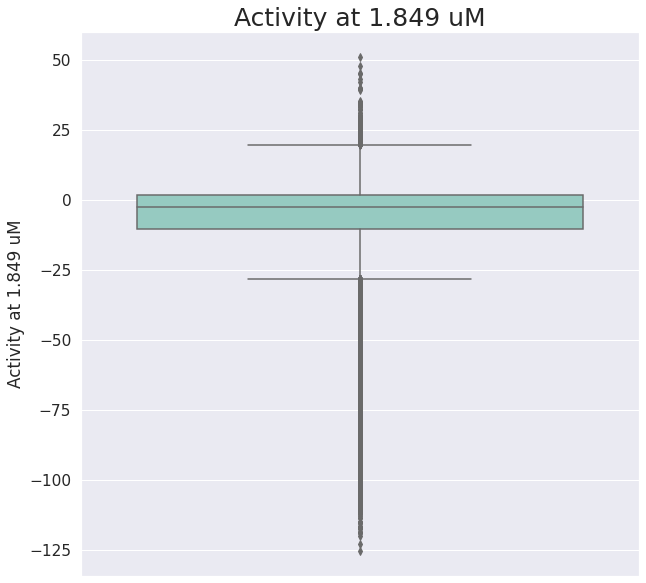

In [18]:
plt.subplots(figsize=(10, 10))
sns.set(font_scale=1.4)
plt.title("Activity at 1.849 uM", fontsize=25)
sns.boxplot(y="Activity at 1.849 uM", data=dataset, palette="Set3")

In [19]:
dataset["Activity at 1.849 uM"].describe()

count    39742.000000
mean        -6.283120
std         16.475083
min       -125.457000
25%        -10.335850
50%         -2.634900
75%          1.663600
max         50.993300
Name: Activity at 1.849 uM, dtype: float64

<AxesSubplot:title={'center':'Activity at 9.037 uM'}, ylabel='Activity at 9.037 uM'>

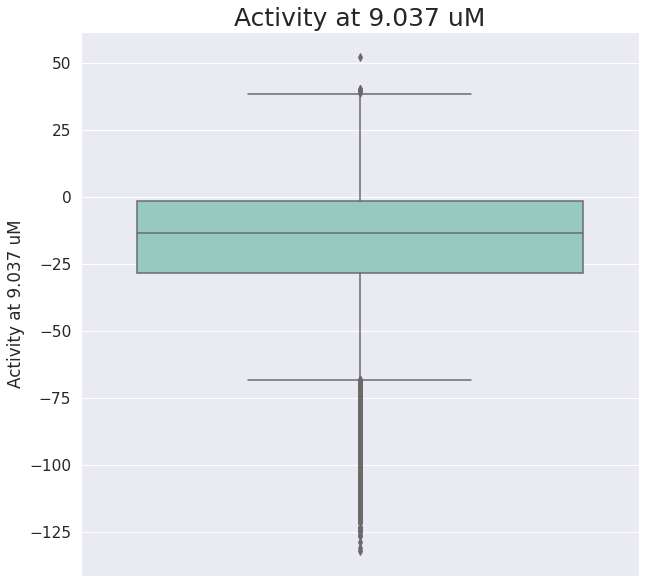

In [20]:
plt.subplots(figsize=(10, 10))
sns.set(font_scale=1.4)
plt.title("Activity at 9.037 uM", fontsize=25)
sns.boxplot(y="Activity at 9.037 uM", data=dataset, palette="Set3")

In [21]:
dataset["Activity at 9.037 uM"].describe()

count    39189.000000
mean       -20.564183
std         27.542152
min       -132.226000
25%        -28.187400
50%        -13.456500
75%         -1.370100
max         52.388100
Name: Activity at 9.037 uM, dtype: float64

<AxesSubplot:title={'center':'Activity at 46.23 uM'}, ylabel='Activity at 46.23 uM'>

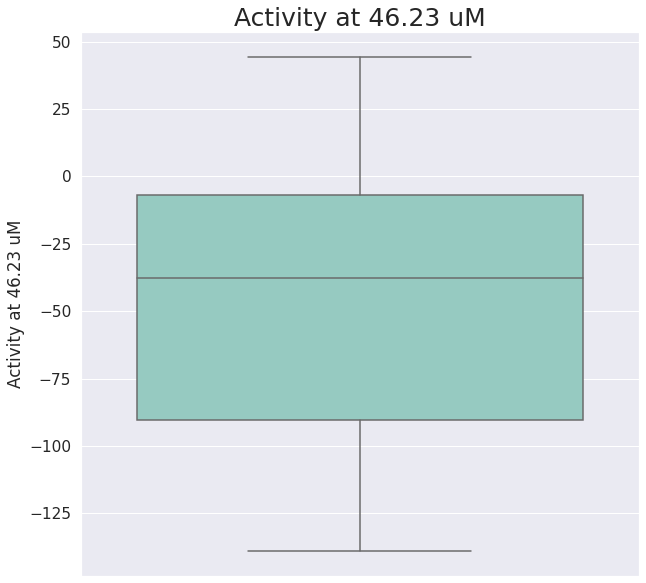

In [22]:
plt.subplots(figsize=(10, 10))
sns.set(font_scale=1.4)
plt.title("Activity at 46.23 uM", fontsize=25)
sns.boxplot(y="Activity at 46.23 uM", data=dataset, palette="Set3")

In [23]:
dataset["Activity at 46.23 uM"].describe()

count    39941.000000
mean       -48.307422
std         42.879640
min       -139.063000
25%        -90.492700
50%        -37.857500
75%         -6.688500
max         44.389300
Name: Activity at 46.23 uM, dtype: float64

## Compound Standardization

The molecules are standardized in order to remove isotope information, neutralize charges, remove stereochemistry and remove smaller fragments.
This way we are accounting for molecular diversity.

In [24]:
def standardize(dataset, id_field ,mols_field,class_field):

    loader = CSVLoader(dataset,
                       id_field=id_field,
                       mols_field = mols_field,
                       labels_fields = class_field)

    dataset = loader.create_dataset()

    standardisation_params = {
        'REMOVE_ISOTOPE': True,
        'NEUTRALISE_CHARGE': True,
        'REMOVE_STEREO': False,
        'KEEP_BIGGEST': True,
        'ADD_HYDROGEN': False,
        'KEKULIZE': True,
        'NEUTRALISE_CHARGE_LATE': True}

    CustomStandardizer(params = standardisation_params).standardize(dataset)

    return dataset

In [25]:
dataset = standardize("../dataset/binary_class/PUBCHEM_ACTIVITY_OUTCOME_binary.csv", "PUBCHEM_CID", "smiles", "PUBCHEM_ACTIVITY_OUTCOME")
dataset.save_to_csv("../dataset/binary_class/standardized_binary.csv")

Standardizing datapoint 0


RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:33] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:

[19:11:33] Running Uncharger
[19:11:33] Running Uncharger
[19:11:33] Running Uncharger
[19:11:33] Running Uncharger
[19:11:33] Running Uncharger
[19:11:33] Running Uncharger
[19:11:33] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Removed negative charge.
[19:11:34] Removed negative charge.
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger


RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:

harger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:

RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:11:34] Running Uncharger
RDKit INFO: [19:

34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Uncharger
[19:11:34] Running Un

RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:

:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running U

RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:11:35] Running Uncharger
RDKit INFO: [19:

ncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:35] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:1

RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:

1:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running 

RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:11:36] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 1000
Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:11:36] Running Uncharger
[19:

RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:

11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running

RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:11:37] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19:11:37] Running Uncharger
[19

RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:

:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Runnin

RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:

g Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[1

RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:11:38] Running Uncharger
RDKit INFO: [19:

9:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Running Uncharger
[19:11:38] Runni

RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:11:39] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[19:11:39] Running Uncharger
[

RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger


RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:11:40] Running Uncharger
RDKit INFO: [19:

[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Running Uncharger
[19:11:40] Run

RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger

RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:11:41] Running Uncharger
RDKit INFO: [19:


[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Running Uncharger
[19:11:41] Ru

RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharge

RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:

r
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] R

RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:11:42] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 3000
unning Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharger
[19:11:42] Running Uncharg

RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:

er
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] 

RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:11:43] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Uncharger
[19:11:43] Running Unchar

RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:

ger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44]

RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:11:44] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncharger
[19:11:44] Running Uncha

RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:

rger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45

RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Unch

RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:11:45] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 4000
arger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:45] Running Uncharger
[19:11:4

RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:

6] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Unc

RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:11:46] Running Uncharger
RDKit INFO: [19:

harger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:46] Running Uncharger
[19:11:

RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:

47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Un

RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:

charger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11

RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:47] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:

:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:47] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running U

RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:

ncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:1

RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:11:48] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 5000
1:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running Uncharger
[19:11:48] Running 

RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:

RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:

11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running Uncharger
[19:11:49] Running

RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:49] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:

 negative charge.
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Removed negative charge.
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running

RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:11:50] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19:11:50] Running Uncharger
[19

RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:

:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Runnin

RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncha

RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:11:51] Running Uncharger
RDKit INFO: [19:

rger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51] Running Uncharger
[19:11:51

RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Unch

RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:11:52] Running Uncharger
RDKit INFO: [19:

arger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:52] Running Uncharger
[19:11:5

RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:

3] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Unc

RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:11:53] Running Uncharger
RDKit INFO: [19:

harger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:53] Running Uncharger
[19:11:

RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:

54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Un

RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:

charger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11

RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:11:54] Running Uncharger
RDKit INFO: [19:

:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running Uncharger
[19:11:54] Running U

RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:

ncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:1

RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:11:55] Running Uncharger
RDKit INFO: [19:

1:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running 

RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:55] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:

RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:

11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running

RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:11:56] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19:11:56] Running Uncharger
[19

RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:

:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Runnin

RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:11:57] Running Uncharger
RDKit INFO: [19:

g Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[1

RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:

9:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Running Uncharger
[19:11:57] Runni

RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[

RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:11:58] Running Uncharger
RDKit INFO: [19:

19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Running Uncharger
[19:11:58] Runn

RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger


RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:

[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Run

RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:11:59] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:11:59] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger

RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:


[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Ru

RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:12:00] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharger
[19:12:00] Running Uncharge

RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:

r
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] R

RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:12:01] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharger
[19:12:01] Running Uncharg

RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:

er
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] 

RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Unchar

RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:12:02] Running Uncharger
RDKit INFO: [19:

ger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02] Running Uncharger
[19:12:02]

RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncha

RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:12:03] Running Uncharger
RDKit INFO: [19:

rger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Removed negative charge.
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[19:12:03] Running Uncharger
[1

RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:

9:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Runni

RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:

9:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Runni

RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:04] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:04] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[

RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:

19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Runn

RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:12:05] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger
[19:12:05] Running Uncharger


RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:

[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Run

RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger

RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:12:06] Running Uncharger
RDKit INFO: [19:


[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Running Uncharger
[19:12:06] Ru

RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharge

RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:12:07] Running Uncharger
RDKit INFO: [19:

r
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] Running Uncharger
[19:12:07] R

RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:12:08] Running Uncharger
RDKit INFO: [19:

er
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] 

RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:08] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Unchar

RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:

ger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09]

RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:12:09] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncharger
[19:12:09] Running Uncha

RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:

rger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10

RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:12:10] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Unch

RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:

arger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:10] Running Uncharger
[19:12:1

RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:

1] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Unc

RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:12:11] Running Uncharger
RDKit INFO: [19:

harger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:11] Running Uncharger
[19:12:

RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 13000
12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running U

RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:

charger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12

RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:12:12] Running Uncharger
RDKit INFO: [19:

:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running Uncharger
[19:12:12] Running U

RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:

ncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:1

RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:

2:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running 

RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:13] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:13] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:

RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:

12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running

RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:12:14] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 14000
 Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[19:12:14] Running Uncharger
[1

RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:

:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Runnin

RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:12:15] Running Uncharger
RDKit INFO: [19:

g Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[19:12:15] Running Uncharger
[1

RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:

9:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Runni

RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:12:16] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[19:12:16] Running Uncharger
[

RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger


RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:12:17] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 15000
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Running Uncharger
[19:12:17] Ru

RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger

RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:12:18] Running Uncharger
RDKit INFO: [19:


[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Ru

RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:

:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running Uncharger
[19:12:18] Running U

RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:

ncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:1

RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:12:19] Running Uncharger
RDKit INFO: [19:

2:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running Uncharger
[19:12:19] Running 

RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:

RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 16000
12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Running Uncharger
[19:12:20] Runnin

RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:12:20] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19

RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:

:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Runnin

RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:12:21] Running Uncharger
RDKit INFO: [19:

g Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[19:12:21] Running Uncharger
[1

RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:12:22] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[19:12:22] Running Uncharger
[

RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:

19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Runn

RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 17000
ing Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger
[19:12:23] Running Uncharger

RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:12:23] Running Uncharger
RDKit INFO: [19:

[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Run

RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger

RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:12:24] Running Uncharger
RDKit INFO: [19:


[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Running Uncharger
[19:12:24] Ru

RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharge

RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:12:25] Running Uncharger
RDKit INFO: [19:

r
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] Running Uncharger
[19:12:25] R

RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharg

RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:12:26] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 18000
er
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26] Running Uncharger
[19:12:26]

RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Unchar

RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:12:27] Running Uncharger
RDKit INFO: [19:

ger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27]

RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncharger
[19:12:27] Running Uncha

RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:

rger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28

RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:12:28] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Uncharger
[19:12:28] Running Unch

RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:

arger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:2

RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:

9] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Unc

RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:12:29] Running Uncharger
RDKit INFO: [19:

harger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:29] Running Uncharger
[19:12:

RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:

30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Un

RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:12:30] Running Uncharger
RDKit INFO: [19:

charger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12:30] Running Uncharger
[19:12

RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:

:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running U

RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:12:31] Running Uncharger
RDKit INFO: [19:

ncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:1

RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:

r
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] Running Uncharger
[19:12:31] R

RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharg

RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:12:32] Running Uncharger
RDKit INFO: [19:

er
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Running Uncharger
[19:12:32] Removed negative charge.
[19:12:32] Removed negative charge.
[19:12:32] Running Uncharger
[19:12:32] Removed negativ

RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:

19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Runn

RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Removed negative charge.
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Removed negative charge.
RDKit INFO: [19:12:33] Removed negative charge.
RDKit INFO: [19:12:33] Removed negative charge.
RDKit INFO: [19:12:33] Remove

ing Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Removed negative charge.
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Removed negative charge.
[19:12:33] Removed negative charge.
[19:12:33] Removed negative charge.
[19:12:33] Removed negative charge.
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Unch

RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:12:33] Running Uncharger
RDKit INFO: [19:

[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Running Uncharger
[19:12:33] Run

RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger

RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:


[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Ru

RDKit INFO: [19:12:34] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharger
[19:12:34] Running Uncharge

RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:

r
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] R

RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharg

RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:12:35] Running Uncharger
RDKit INFO: [19:

er
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] Running Uncharger
[19:12:35] 

RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Unchar

RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:

ger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36]

RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:36] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:36] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncha

RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:

rger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37

RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:12:37] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Uncharger
[19:12:37] Running Unch

RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:

arger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:3

RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:

8] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Unc

RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:12:38] Running Uncharger
RDKit INFO: [19:

harger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:38] Running Uncharger
[19:12:

RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:

39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Un

RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:

charger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12

RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:12:39] Running Uncharger
RDKit INFO: [19:

:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running Uncharger
[19:12:39] Running U

RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 23000
ncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:

RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:

2:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running 

RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:12:40] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:12:40] Running Uncharger
[19:

RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:

12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running

RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19

RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:12:41] Running Uncharger
RDKit INFO: [19:

:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:41] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Runnin

RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:

g Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[1

RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:12:42] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 24000
9:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Running Uncharger
[19:12:42] Runn

RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[

RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:

19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Runn

RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:12:43] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger
[19:12:43] Running Uncharger


RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:

[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Run

RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger

RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:12:44] Running Uncharger
RDKit INFO: [19:


[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Running Uncharger
[19:12:44] Ru

RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 25000
nning Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharg

RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:12:45] Running Uncharger
RDKit INFO: [19:

r
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] R

RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharger
[19:12:45] Running Uncharg

RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:

RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:12:46] Running Uncharger
RDKit INFO: [19:

12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running Uncharger
[19:12:46] Running

RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19

RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 26000
g Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[19:12:47] Running Uncharger
[

RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:12:47] Running Uncharger
RDKit INFO: [19:

9:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Runni

RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:12:48] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[

RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:

19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Running Uncharger
[19:12:48] Runn

RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger


RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:12:49] Running Uncharger
RDKit INFO: [19:

[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Running Uncharger
[19:12:49] Run

RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:12:49] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger

RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:12:50] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharger
[19:12:50] Running Uncharge

RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:

r
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] R

RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:12:51] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharger
[19:12:51] Running Uncharg

RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:

er
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] 

RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Unchar

RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:12:52] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19:12:52] Running Uncharger
[19

RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:

:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Runnin

RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncha

RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:12:53] Running Uncharger
RDKit INFO: [19:

rger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53] Running Uncharger
[19:12:53

RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Unch

RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:

arger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:5

RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:54] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:

4] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:54] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Unc

RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:

harger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:

RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:12:55] Running Uncharger
RDKit INFO: [19:

55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Uncharger
[19:12:55] Running Un

RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:

charger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12

RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:

:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running U

RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:12:56] Running Uncharger
RDKit INFO: [19:

ncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:12:56] Running Uncharger
[19:1

RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:

2:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running 

RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:

RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:12:57] Running Uncharger
RDKit INFO: [19:

12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running Uncharger
[19:12:57] Running

RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:

 Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19

RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:12:58] Running Uncharger
RDKit INFO: [19:

:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Running Uncharger
[19:12:58] Runnin

RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:

g Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[1

RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:

9:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Runni

RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:12:59] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[19:12:59] Running Uncharger
[

RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:

19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Runn

RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:13:00] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger
[19:13:00] Running Uncharger


RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:

[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Removed negative charge.
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:

RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:13:01] Running Uncharger
RDKit INFO: [19:

01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Un

RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:

charger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:01] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13

RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:

:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running U

RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:13:02] Running Uncharger
RDKit INFO: [19:

ncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:13:02] Running Uncharger
[19:1

RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:

3:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running 

RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:

Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:13:03] Running Uncharger
[19:

RDKit INFO: [19:13:03] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:

13:03] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Removed negative charge.
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] 

RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Unchar

RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:13:04] Running Uncharger
RDKit INFO: [19:

ger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04] Running Uncharger
[19:13:04]

RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncha

RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:13:05] Running Uncharger
RDKit INFO: [19:

rger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05] Running Uncharger
[19:13:05

RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Unch

RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:13:06] Running Uncharger
RDKit INFO: [19:

arger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:0

RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:

6] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Uncharger
[19:13:06] Running Unc

RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:

harger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:

RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:07] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:

07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Uncharger
[19:13:07] Running Un

RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:

charger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13

RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:13:08] Running Uncharger
RDKit INFO: [19:

:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running U

RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:

ncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:08] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:1

RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:

r
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] R

RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:13:09] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharger
[19:13:09] Running Uncharg

RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:

er
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] 

RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:13:10] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Unchar

RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:

ger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10] Running Uncharger
[19:13:10]

RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:

ger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11]

RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:13:11] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncharger
[19:13:11] Running Uncha

RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:

rger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12

RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Unch

RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:13:12] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 35000
arger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:12] Running Uncharger
[19:13:

RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:

19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Runn

RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger


RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:13] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:

[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Running Uncharger
[19:13:13] Run

RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:

ning Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger

RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:


[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Ru

RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:13:14] Running Uncharger
RDKit INFO: [19:

nning Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:14] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharge

RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 36000
r
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] 

RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:13:15] Running Uncharger
RDKit INFO: [19:

r
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] Running Uncharger
[19:13:15] R

RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharg

RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:13:16] Running Uncharger
RDKit INFO: [19:

er
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] 

RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:13:16] Running Uncharger
[19:13:16] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Unchar

RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:

ger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17]

RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:13:17] Running Uncharger
RDKit INFO: [19:

 Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncharger
[19:13:17] Running Uncha

RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 37000
rger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:1

RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:13:18] Running Uncharger
RDKit INFO: [19:

] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Uncharger
[19:13:18] Running Unch

RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:

arger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:1

RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:

9] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Unc

RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:13:19] Running Uncharger
RDKit INFO: [19:

harger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:19] Running Uncharger
[19:13:

RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:

20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Un

RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:

charger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13

RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:13:20] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 38000
:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running Uncharger
[19:13:20] Running 

RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:

ncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:1

RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:13:21] Running Uncharger
RDKit INFO: [19:

r
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] Running Uncharger
[19:13:21] R

RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:

unning Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharg

RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:

er
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] 

RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:13:22] Running Uncharger
RDKit INFO: [19:

Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Uncharger
[19:13:22] Running Unchar

RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:

ger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23]

RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:

Standardizing datapoint 39000
 Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Unch

RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:13:23] Running Uncharger
RDKit INFO: [19:

charger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13:23] Running Uncharger
[19:13

RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Removed negative charge.
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INF

[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Run

RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:

9:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Runni

RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:13:24] Running Uncharger
RDKit INFO: [19:

ng Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[

RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:

19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Running Uncharger
[19:13:24] Runn

RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:

ing Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger


RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:13:25] Running Uncharger
RDKit INFO: [19:

[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Running Uncharger
[19:13:25] Run

RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:13:26] Running Uncharger
RDKit INFO: [19:

In [26]:
dataset = pd.read_csv("../dataset/standardized.csv")

## Feature Generation

This step is divided in two ways: **molecular descriptors** and **molecular fingerprints**.
**Molecular Descriptors** are an abstract representation of certain structural features of a molecule. These descriptors may represent a structural key within a molecule. This might be as simple as a count of a particular atom type, it might be the presence of a particular ring system and/or it might be a calculated property.
**Molecular Fingerprints** are more abstract than a structural key but have the advantage of being more general since they do not represent pre-defined patterns.

In [27]:
loader = CSVLoader("../dataset/binary_class/standardized_binary.csv",
                   mols_field='mols',
                   labels_fields='y')

dataset_des = loader.create_dataset()
dataset_finger = copy.deepcopy(dataset_des)

### Molecular Descriptors

In [28]:
calc = MoleculeDescriptors.MolecularDescriptorCalculator([x[0] for x in Descriptors._descList])
header = list(calc.GetDescriptorNames())
header

['MaxEStateIndex',
 'MinEStateIndex',
 'MaxAbsEStateIndex',
 'MinAbsEStateIndex',
 'qed',
 'MolWt',
 'HeavyAtomMolWt',
 'ExactMolWt',
 'NumValenceElectrons',
 'NumRadicalElectrons',
 'MaxPartialCharge',
 'MinPartialCharge',
 'MaxAbsPartialCharge',
 'MinAbsPartialCharge',
 'FpDensityMorgan1',
 'FpDensityMorgan2',
 'FpDensityMorgan3',
 'BCUT2D_MWHI',
 'BCUT2D_MWLOW',
 'BCUT2D_CHGHI',
 'BCUT2D_CHGLO',
 'BCUT2D_LOGPHI',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRHI',
 'BCUT2D_MRLOW',
 'BalabanJ',
 'BertzCT',
 'Chi0',
 'Chi0n',
 'Chi0v',
 'Chi1',
 'Chi1n',
 'Chi1v',
 'Chi2n',
 'Chi2v',
 'Chi3n',
 'Chi3v',
 'Chi4n',
 'Chi4v',
 'HallKierAlpha',
 'Ipc',
 'Kappa1',
 'Kappa2',
 'Kappa3',
 'LabuteASA',
 'PEOE_VSA1',
 'PEOE_VSA10',
 'PEOE_VSA11',
 'PEOE_VSA12',
 'PEOE_VSA13',
 'PEOE_VSA14',
 'PEOE_VSA2',
 'PEOE_VSA3',
 'PEOE_VSA4',
 'PEOE_VSA5',
 'PEOE_VSA6',
 'PEOE_VSA7',
 'PEOE_VSA8',
 'PEOE_VSA9',
 'SMR_VSA1',
 'SMR_VSA10',
 'SMR_VSA2',
 'SMR_VSA3',
 'SMR_VSA4',
 'SMR_VSA5',
 'SMR_VSA6',
 'SMR_VSA7',
 'SMR_

In [29]:
TwoDimensionDescriptors().featurize(dataset_des)

Featurizing datapoint 0
Featurizing datapoint 1000
Featurizing datapoint 2000
Featurizing datapoint 3000
Featurizing datapoint 4000
Featurizing datapoint 5000
Featurizing datapoint 6000
Featurizing datapoint 7000
Featurizing datapoint 8000
Featurizing datapoint 9000
Featurizing datapoint 10000
Featurizing datapoint 11000
Featurizing datapoint 12000
Featurizing datapoint 13000
Featurizing datapoint 14000
Featurizing datapoint 15000
Featurizing datapoint 16000
Featurizing datapoint 17000
Featurizing datapoint 18000
Featurizing datapoint 19000
Featurizing datapoint 20000
Featurizing datapoint 21000
Featurizing datapoint 22000
Featurizing datapoint 23000
Featurizing datapoint 24000
Featurizing datapoint 25000
Featurizing datapoint 26000
Featurizing datapoint 27000
Featurizing datapoint 28000
Featurizing datapoint 29000
Featurizing datapoint 30000
Featurizing datapoint 31000
Featurizing datapoint 32000
Featurizing datapoint 33000
Featurizing datapoint 34000
Featurizing datapoint 35000
Featu

#### Create dataframe with feature names

In [30]:
descript_data = pd.DataFrame(dataset_des.X, columns=header)
descript_data

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,...,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.074888,0.631225,6.074888,0.631225,0.770615,272.739,259.635,272.082874,96.0,0.0,0.143034,-0.359915,0.359915,0.143034,1.263158,2.157895,2.894737,35.495691,10.124662,2.101514,-2.075432,2.268008,-2.095096,6.309993,0.764994,2.288533,706.792751,13.242276,10.443600,11.199529,9.275188,6.022567,6.400531,4.264039,4.700474,2.892052,3.127149,2.068868,2.240971,-1.91,4.059865e+04,12.140660,4.992482,2.322011,115.401631,10.300767,5.824404,0.000000,0.000000,0.000000,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10.634987,-0.774221,10.634987,0.160394,0.699336,358.269,337.101,357.101082,126.0,0.0,0.302854,-0.481230,0.481230,0.302854,1.304348,2.000000,2.608696,35.496754,10.211525,2.114891,-2.222565,2.230186,-2.269502,6.183121,-0.136617,2.231667,666.634255,16.819626,13.134830,14.646688,11.062081,7.605097,8.674142,5.372370,6.128299,3.822070,4.160132,2.630154,3.038231,-1.46,1.537221e+05,17.887051,8.408364,4.515923,145.358449,14.573537,5.824404,0.000000,0.000000,0.000000,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,13.094332,-1.461928,13.094332,0.000577,0.126401,656.733,612.381,656.305744,256.0,0.0,0.349448,-0.461564,0.461564,0.349448,0.744681,1.276596,1.872340,16.628380,10.049648,2.399489,-2.332601,2.267276,-2.494797,5.808629,-0.192753,2.284736,1663.358478,34.672633,27.881943,27.881943,22.411855,16.075396,16.075396,11.384994,11.384994,7.378035,7.378035,4.939983,4.939983,-4.62,9.736055e+09,36.844047,17.339332,9.932210,272.054732,23.514551,6.606882,29.830232,0.000000,5.559267,...,0.0,2.0,0.0,0.0,0.0,4.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,12.477361,-1.314158,12.477361,0.002728,0.259940,477.481,454.297,477.176067,180.0,0.0,0.325721,-0.481229,0.481229,0.325721,1.085714,1.800000,2.428571,16.371406,9.905664,2.219087,-2.162739,2.249572,-2.406347,5.962707,-0.140089,1.755997,1304.098288,25.534805,18.509956,18.509956,16.671943,10.510531,10.510531,7.728603,7.728603,5.215507,5.215507,3.457140,3.457140,-4.79,4.249385e+07,24.844622,10.885936,6.382538,199.365020,26.997178,6.041841,16.981741,5.948339,5.907180,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,13.155177,-1.002846,13.155177,0.044518,0.178339,540.708,504.420,540.207627,200.0,0.0,0.329021,-0.456048,0.456048,0.3290

In [31]:
descript_data.shape

(39989, 208)

As we can see, after generating the molecular descriptors, we ended up with **208 features**.

In [32]:
descript_data.describe()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,...,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
count,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.0,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,3.998900e+04,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,...,39989.000000,39989.000000,39989.0,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.0,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.0,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.00000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000,39989.000000
mean,11.600994,-0.841433,11.600994,0.170013,0.645833,354.755754,334.808299,354.358630,130.253620,0.0,0.264725,-0.419853,0.422055,0.262524,1.125275,1.842798,2.511068,27.241522,10.084141,2.226888,-2.195572,2.270817,-2.296713,6.810198,0.026262,1.848680,843.121946,17.767674,14.071753,14.671295,12.039276,8.127655,8.735332,5.987861,6.684371,4.157401,4.760613,2.864299,3.351646,-2.547413,1.467820e+36,17.170672,7.398587,3.888207,148.297407,11.380981,7.182624,4.595572,4.587625,3.576528,...,0.000075,0.601490,0.0,0.002201,0.000850,0.110605,0.756783,0.104854,0.006352,0.387332,0.022506,0.050189,0.065968,0.031734,0.0,0.000050,0.089725,0.073795,0.000975,0.005051,0.344195,0.049814,0.040911,0.073070,0.058566,0.035635,0.000450,0.013504,0.007327,0.374928,0.051689,0.051389,0.000125,0.000125,0.115532,0.097177,0.015104,0.0,0.190827,0.003026,0.134612,0.114356,0.017305,0.00140,0.040861,0.043087,0.000150,0.078522,0.105229,0.035085
std,2.393259,1.393566,2.393259,0.199440,0.169638,80.350241,76.134256,80.252172,30.108918,0.0,0.068875,0.076832,0.075030,0.065758,0.181940,0.237285,0.287718,13.794459,0.149692,0.125826,0.129663,0.100907,0.166099,1.043799,0.303297,0.376124,275.833990,3.999981,3.327371,3.354675,2.786730,2.056781,2.166830,1.685169,1.875438,1.339252,1.531112,1.069387,1.227272,0.823468,2.935237e+38,4.151512,2.076985,1.388147,33.151598,6.891092,6.884845,5.747479,5.569630,4.412767,...,0.008661,0.897566,0.0,0.046860,0.033906,0.354588,0.960775,0.321659,0.086959,0.791409,0.149834,0.220389,0.251631,0.188756,0.0,

In [33]:
descript_data["activity"] = dataset_des.y
descript_data

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,...,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,activity
0,6.074888,0.631225,6.074888,0.631225,0.770615,272.739,259.635,272.082874,96.0,0.0,0.143034,-0.359915,0.359915,0.143034,1.263158,2.157895,2.894737,35.495691,10.124662,2.101514,-2.075432,2.268008,-2.095096,6.309993,0.764994,2.288533,706.792751,13.242276,10.443600,11.199529,9.275188,6.022567,6.400531,4.264039,4.700474,2.892052,3.127149,2.068868,2.240971,-1.91,4.059865e+04,12.140660,4.992482,2.322011,115.401631,10.300767,5.824404,0.000000,0.000000,0.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,10.634987,-0.774221,10.634987,0.160394,0.699336,358.269,337.101,357.101082,126.0,0.0,0.302854,-0.481230,0.481230,0.302854,1.304348,2.000000,2.608696,35.496754,10.211525,2.114891,-2.222565,2.230186,-2.269502,6.183121,-0.136617,2.231667,666.634255,16.819626,13.134830,14.646688,11.062081,7.605097,8.674142,5.372370,6.128299,3.822070,4.160132,2.630154,3.038231,-1.46,1.537221e+05,17.887051,8.408364,4.515923,145.358449,14.573537,5.824404,0.000000,0.000000,0.000000,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,13.094332,-1.461928,13.094332,0.000577,0.126401,656.733,612.381,656.305744,256.0,0.0,0.349448,-0.461564,0.461564,0.349448,0.744681,1.276596,1.872340,16.628380,10.049648,2.399489,-2.332601,2.267276,-2.494797,5.808629,-0.192753,2.284736,1663.358478,34.672633,27.881943,27.881943,22.411855,16.075396,16.075396,11.384994,11.384994,7.378035,7.378035,4.939983,4.939983,-4.62,9.736055e+09,36.844047,17.339332,9.932210,272.054732,23.514551,6.606882,29.830232,0.000000,5.559267,...,2.0,0.0,0.0,0.0,4.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,12.477361,-1.314158,12.477361,0.002728,0.259940,477.481,454.297,477.176067,180.0,0.0,0.325721,-0.481229,0.481229,0.325721,1.085714,1.800000,2.428571,16.371406,9.905664,2.219087,-2.162739,2.249572,-2.406347,5.962707,-0.140089,1.755997,1304.098288,25.534805,18.509956,18.509956,16.671943,10.510531,10.510531,7.728603,7.728603,5.215507,5.215507,3.457140,3.457140,-4.79,4.249385e+07,24.844622,10.885936,6.382538,199.365020,26.997178,6.041841,16.981741,5.948339,5.907180,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,13.155177,-1.002846,13.155177,0.044518,0.178339,540.708,504.420,540.207627,200.0,0.0,0.329021,-0.456048,0.456048,0.329021,0.944444,1.638

In [34]:
descript_data.to_csv('../dataset/binary_class/descriptors_binary.csv', index=False)

In [35]:
# separar o dataframe por atividade
moldes_1 = descript_data[descript_data["activity"] == 1]
moldes_0 = descript_data[descript_data["activity"] == 0]

In [36]:
moldes_1.describe()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,...,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,activity
count,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.0,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,1.999100e+04,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,...,19991.000000,19991.0,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.0,19991.000000,19991.000000,19991.000000,19991.00000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.0,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.000000,19991.0
mean,11.551680,-0.816006,11.551680,0.180283,0.604744,380.201085,358.831697,379.758286,139.231354,0.0,0.259556,-0.422209,0.424766,0.257000,1.082342,1.807501,2.495743,28.215345,10.064253,2.231785,-2.210666,2.290933,-2.298901,6.843516,0.051522,1.755467,944.515294,18.989696,15.138160,15.784261,12.956227,8.805359,9.430942,6.520724,7.246530,4.593744,5.224862,3.194657,3.711864,-2.728277,2.157181e+22,18.273741,7.831871,4.012179,159.428097,11.624916,7.764935,4.991193,4.115523,3.715812,...,0.755890,0.0,0.002501,0.001251,0.095143,0.779351,0.110500,0.008554,0.463459,0.011255,0.048172,0.074183,0.021109,0.0,0.000100,0.106098,0.083187,0.00080,0.004052,0.368866,0.044470,0.037067,0.078885,0.064529,0.038767,0.000450,0.019409,0.006853,0.446401,0.071832,0.071632,0.000100,0.000100,0.136712,0.127057,0.009454,0.0,0.212596,0.003051,0.115652,0.111700,0.022360,0.001301,0.033765,0.050423,0.000300,0.085589,0.120004,0.027162,1.0
std,2.674951,1.456291,2.674951,0.213888,0.165657,75.180301,71.121177,75.094157,28.651229,0.0,0.073056,0.076720,0.074757,0.069205,0.166505,0.223268,0.276365,15.118612,0.142505,0.119941,0.128571,0.091427,0.163531,1.079801,0.318897,0.338279,263.840719,3.762180,3.175055,3.156638,2.616699,1.984259,2.074980,1.648759,1.833028,1.332839,1.530923,1.075048,1.243964,0.807136,3.050028e+24,3.930979,1.952630,1.278414,30.892967,6.827023,7.077064,5.958788,5.385603,4.373349,...,0.960312,0.0,0.049950,0.043004,0.334825,0.984312,0.329089,0.104318,0.854996,0.105494,0.215763,0.266430,0.156419,0.0,0.010002,0.345627,0.302950,0

In [37]:
moldes_0.describe()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,...,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,activity
count,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.0,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,1.999800e+04,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,...,19998.000000,19998.0,19998.000000,19998.00000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.0,19998.0,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.00000,19998.000000,19998.000000,19998.00000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.0,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.000000,19998.0,19998.000000,19998.000000,19998.000000,19998.0
mean,11.650290,-0.866851,11.650290,0.159747,0.686907,329.319330,310.793310,328.967866,121.279028,0.0,0.269893,-0.417499,0.419346,0.268047,1.168194,1.878083,2.526388,26.268040,10.104022,2.221993,-2.180483,2.250709,-2.294524,6.776892,0.001011,1.941861,741.764088,16.546079,13.005720,13.558719,11.122647,7.450187,8.039966,5.455186,6.122409,3.721211,4.296527,2.534057,2.991554,-2.366612,2.935127e+36,16.067990,6.965454,3.764278,137.170614,11.137132,6.600516,4.200089,5.059563,3.437294,...,0.447145,0.0,0.001900,0.00045,0.126063,0.734223,0.099210,0.004150,0.311231,0.033753,0.052205,0.057756,0.042354,0.0,0.0,0.073357,0.064406,0.001150,0.006051,0.319532,0.055156,0.044754,0.067257,0.052605,0.032503,0.00045,0.007601,0.007801,0.30348,0.031553,0.031153,0.000150,0.000150,0.094359,0.067307,0.020752,0.0,0.169067,0.003000,0.153565,0.117012,0.012251,0.001500,0.047955,0.035754,0.0,0.071457,0.090459,0.043004,0.0
std,2.072665,1.327455,2.072665,0.183296,0.163516,77.239702,73.355031,77.149590,28.828693,0.0,0.064010,0.076874,0.075207,0.061631,0.186536,0.245499,0.297856,12.252711,0.154005,0.131268,0.128995,0.105813,0.168602,1.005448,0.284632,0.388761,249.011925,3.854944,3.128683,3.172890,2.646485,1.898787,2.029180,1.547148,1.744396,1.195912,1.383528,0.955689,1.098018,0.799602,4.150688e+38,4.072516,2.107063,1.479471,31.559769,6.946163,6.636474,5.499955,5.708952,4.447574,...,0.800923,0.0,0.043551,0.02121,0.372667,0.936136,0.313964,0.065065,0.714228,0.183073,0.224905,0.235633,0.215785,0.0,0.0,0.288759,0.272146,0.035339,0.081941,0.659450,0.23

We selected 4 of these descriptors to further examine the distribution of these characteristics.
**ExactMolWt** corresponds to the molecular weight of the molecule.
**NumAromaticRings** enumerates the amount of aromatic rings.
**RingCount** enumerates the amount of rings.
**TPSA** or topological polar surface area corresponds to the polar surface area of the molecule.

In [38]:
def generate_box_plot(feature, class_name, title, dataframe, orientation):
    plt.subplots(figsize=(20, 10))
    sns.set(font_scale=1.4)
    plt.title(title, fontsize=25)
    sns.boxplot(x=feature, y=class_name, orient=orientation,
                data=dataframe, palette="Set3")

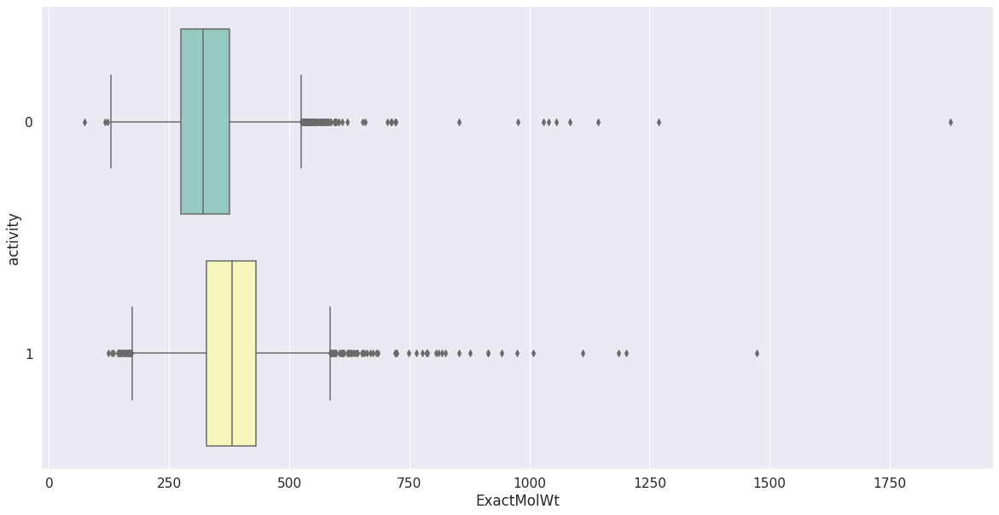

In [39]:
generate_box_plot("ExactMolWt", "activity", "", descript_data, "h")

In [40]:
moldes_1["ExactMolWt"].describe()

count    19991.000000
mean       379.758286
std         75.094157
min        123.079647
25%        327.174119
50%        380.083078
75%        430.200491
max       1472.581284
Name: ExactMolWt, dtype: float64

In [41]:
moldes_0["ExactMolWt"].describe()

count    19998.000000
mean       328.967866
std         77.149590
min         74.036779
25%        275.163377
50%        321.199625
75%        375.157620
max       1875.540932
Name: ExactMolWt, dtype: float64

Comparing both box plots, we can observe that the median molecular weight is slightly higher on the active molecules.

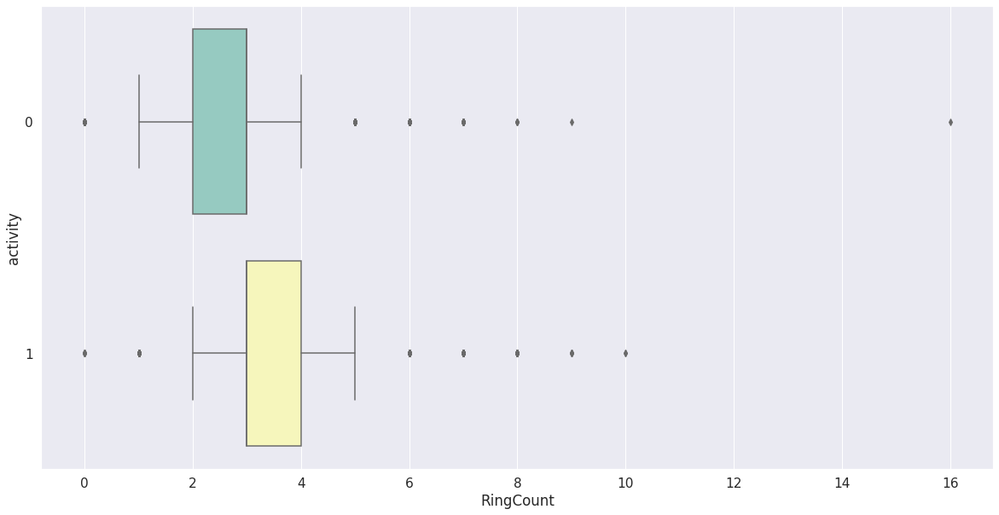

In [42]:
generate_box_plot("RingCount", "activity", "", descript_data, "h")

In [43]:
moldes_1["RingCount"].describe()

count    19991.000000
mean         3.465910
std          1.046983
min          0.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         10.000000
Name: RingCount, dtype: float64

In [44]:
moldes_0["RingCount"].describe()

count    19998.000000
mean         2.732373
std          0.924939
min          0.000000
25%          2.000000
50%          3.000000
75%          3.000000
max         16.000000
Name: RingCount, dtype: float64

Comparing both box plots, we can observe that the median ring count is slightly higher on the active molecules.

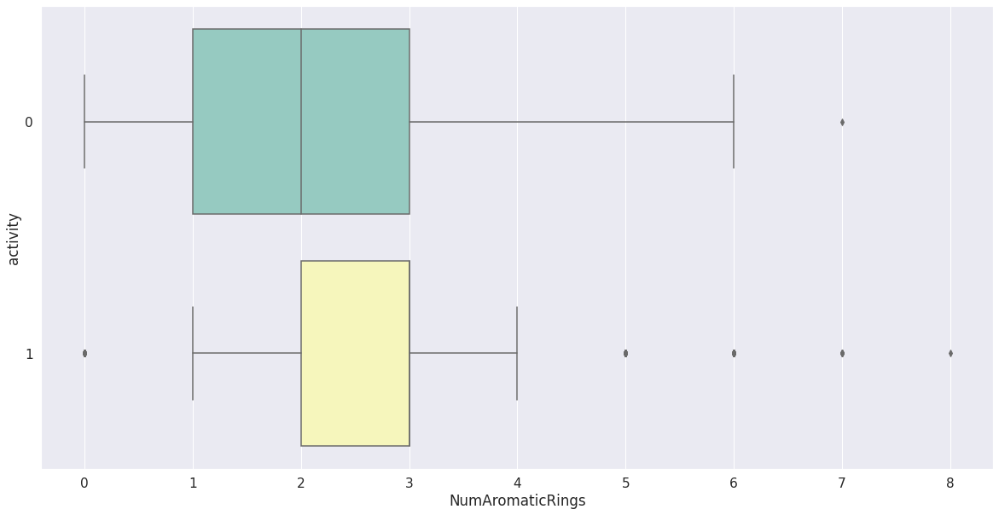

In [45]:
generate_box_plot("NumAromaticRings", "activity", "", descript_data, "h")

In [46]:
moldes_1["NumAromaticRings"].describe()

count    19991.000000
mean         2.682807
std          0.942246
min          0.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          8.000000
Name: NumAromaticRings, dtype: float64

In [47]:
moldes_0["NumAromaticRings"].describe()

count    19998.000000
mean         2.047405
std          0.885365
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          7.000000
Name: NumAromaticRings, dtype: float64

Comparing both box plots, we can observe that the median number of aromatic rings is slightly higher on the active molecules.

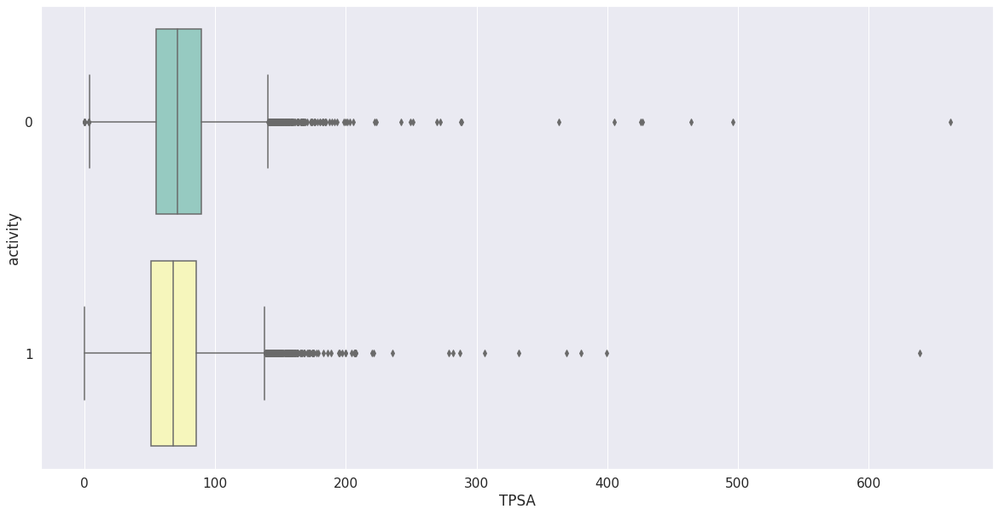

In [48]:
generate_box_plot("TPSA", "activity", "", descript_data, "h")

In [49]:
moldes_1["TPSA"].describe()

count    19991.000000
mean        69.189605
std         27.725162
min          0.000000
25%         50.750000
50%         68.020000
75%         85.610000
max        639.100000
Name: TPSA, dtype: float64

In [50]:
moldes_0["TPSA"].describe()

count    19998.000000
mean        73.075755
std         27.698442
min          0.000000
25%         54.880000
50%         71.090000
75%         89.130000
max        662.410000
Name: TPSA, dtype: float64

Unlike the previous results, we can observe that the active molecules have a slightly lower median topological polar surface area than the inactive ones.


#### Normalize Data

In [51]:
StandardScaler().fit_transform(dataset_des)

### Molecular Fingerprints

We are gonna study three different ways of constructing fingerprints.
MorganFingerprint, RDKFingerprint and MACCSkeysFingerprint.

In [52]:
dataset_morgan = copy.deepcopy(dataset_finger)
dataset_rdk = copy.deepcopy(dataset_finger)
dataset_macc = copy.deepcopy(dataset_finger)

In [53]:
MorganFingerprint().featurize(dataset_morgan)

Featurizing datapoint 0
Featurizing datapoint 1000
Featurizing datapoint 2000
Featurizing datapoint 3000
Featurizing datapoint 4000
Featurizing datapoint 5000
Featurizing datapoint 6000
Featurizing datapoint 7000
Featurizing datapoint 8000
Featurizing datapoint 9000
Featurizing datapoint 10000
Featurizing datapoint 11000
Featurizing datapoint 12000
Featurizing datapoint 13000
Featurizing datapoint 14000
Featurizing datapoint 15000
Featurizing datapoint 16000
Featurizing datapoint 17000
Featurizing datapoint 18000
Featurizing datapoint 19000
Featurizing datapoint 20000
Featurizing datapoint 21000
Featurizing datapoint 22000
Featurizing datapoint 23000
Featurizing datapoint 24000
Featurizing datapoint 25000
Featurizing datapoint 26000
Featurizing datapoint 27000
Featurizing datapoint 28000
Featurizing datapoint 29000
Featurizing datapoint 30000
Featurizing datapoint 31000
Featurizing datapoint 32000
Featurizing datapoint 33000
Featurizing datapoint 34000
Featurizing datapoint 35000
Featu

In [54]:
dataset_morgan.X.shape

(39990, 2048)

In [55]:
RDKFingerprint().featurize(dataset_rdk)

Featurizing datapoint 0
Featurizing datapoint 1000
Featurizing datapoint 2000
Featurizing datapoint 3000
Featurizing datapoint 4000
Featurizing datapoint 5000
Featurizing datapoint 6000
Featurizing datapoint 7000
Featurizing datapoint 8000
Featurizing datapoint 9000
Featurizing datapoint 10000
Featurizing datapoint 11000
Featurizing datapoint 12000
Featurizing datapoint 13000
Featurizing datapoint 14000
Featurizing datapoint 15000
Featurizing datapoint 16000
Featurizing datapoint 17000
Featurizing datapoint 18000
Featurizing datapoint 19000
Featurizing datapoint 20000
Featurizing datapoint 21000
Featurizing datapoint 22000
Featurizing datapoint 23000
Featurizing datapoint 24000
Featurizing datapoint 25000
Featurizing datapoint 26000
Featurizing datapoint 27000
Featurizing datapoint 28000
Featurizing datapoint 29000
Featurizing datapoint 30000
Featurizing datapoint 31000
Featurizing datapoint 32000
Featurizing datapoint 33000
Featurizing datapoint 34000
Featurizing datapoint 35000
Featu

In [56]:
dataset_rdk.X.shape

(39990, 2048)

In [57]:
MACCSkeysFingerprint().featurize(dataset_macc)

Featurizing datapoint 0
Featurizing datapoint 1000
Featurizing datapoint 2000
Featurizing datapoint 3000
Featurizing datapoint 4000
Featurizing datapoint 5000
Featurizing datapoint 6000
Featurizing datapoint 7000
Featurizing datapoint 8000
Featurizing datapoint 9000
Featurizing datapoint 10000
Featurizing datapoint 11000
Featurizing datapoint 12000
Featurizing datapoint 13000
Featurizing datapoint 14000
Featurizing datapoint 15000
Featurizing datapoint 16000
Featurizing datapoint 17000
Featurizing datapoint 18000
Featurizing datapoint 19000
Featurizing datapoint 20000
Featurizing datapoint 21000
Featurizing datapoint 22000
Featurizing datapoint 23000
Featurizing datapoint 24000
Featurizing datapoint 25000
Featurizing datapoint 26000
Featurizing datapoint 27000
Featurizing datapoint 28000
Featurizing datapoint 29000
Featurizing datapoint 30000
Featurizing datapoint 31000
Featurizing datapoint 32000
Featurizing datapoint 33000
Featurizing datapoint 34000
Featurizing datapoint 35000
Featu

In [58]:
dataset_macc.X.shape

(39990, 167)

Both Morgan and RDK fingerprint techniques produced **2048 features** while MACCSkeys produced only **167 features**.

## Feature Selection

Variance is the measurement of the spread between numbers in a variable. It measures how far a number is from the mean and every number in a variable.
The variance of a feature determines how much it is impacting the response variable. If the variance is low, it implies there is no impact of this feature on response and vice-versa.
To select the features with the most variance, we applied the boruta algorithm to the molecular descriptors and selected 10% of the highest ranking features of the molecular fingerprints.

### Molecular Descriptors

In [59]:
rf = RandomForestClassifier(n_jobs=-1)
feat_selector = BorutaPy(estimator=rf, max_iter=10, n_estimators=100)

feat_selector.fit(X=dataset_des.X, y=dataset_des.y)
X_filtered = feat_selector.transform(X=dataset_des.X)

In [60]:
features = []
for i in range(len(feat_selector.support_)):
    if feat_selector.support_[i] == True:
        features.append(header[i])

In [61]:
descript_data = pd.DataFrame(X_filtered, columns=features)
descript_data['activity'] = dataset_des.y
descript_data

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA12,PEOE_VSA2,PEOE_VSA7,PEOE_VSA8,SMR_VSA1,SMR_VSA10,SMR_VSA3,SMR_VSA7,SlogP_VSA2,SlogP_VSA3,SlogP_VSA5,SlogP_VSA6,SlogP_VSA8,TPSA,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA8,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,FractionCSP3,HeavyAtomCount,NOCount,NumAromaticCarbocycles,NumAromaticRings,RingCount,MolLogP,MolMR,fr_C_O,fr_amide,fr_benzene
0,-2.309058,1.056768,-2.309058,2.312571,0.735588,-1.020753,-0.987390,-1.025228,-1.137671,-1.766876,0.780127,-0.828210,-1.817133,0.757854,1.327942,1.333505,0.598376,0.270698,-0.996417,0.926566,-0.027839,1.213850,-0.479222,2.435702,1.169450,-0.494250,-1.131369,-1.090410,-1.034917,-0.991887,-1.023499,-1.077533,-1.022951,-1.057844,-0.944829,-1.066862,-0.743830,-0.905007,0.774068,-1.211625,-1.158475,-1.128277,-0.992296,-0.156757,-0.823696,-1.349708,-0.010146,-0.325937,-1.640412,-0.072151,1.365629,-0.321496,-0.644271,-0.430555,-1.129764,-0.423844,2.079730,-0.631158,-1.371151,-0.488716,0.453780,0.146106,-0.886825,1.336600,-0.585362,-0.375215,0.131438,0.365813,-0.268183,-0.059597,-0.885984,-0.872590,-1.041601,-0.858865,-0.554430,0.656042,-0.094028,-0.085153,-0.889202,-1.186415,-0.966478,-0.553706
1,-0.403641,0.048231,-0.403641,-0.048228,0.315403,0.043725,0.030114,0.034173,-0.141276,0.553593,-0.798850,0.788688,0.613304,0.984249,0.662511,0.339321,0.598453,0.850986,-0.890098,-0.208182,-0.402670,0.163826,-0.600772,-0.537034,1.018257,-0.639841,-0.237016,-0.281584,-0.007335,-0.350665,-0.254069,-0.028240,-0.365245,-0.296506,-0.250390,-0.392191,-0.218955,-0.255379,1.320544,0.172561,0.486181,0.452203,-0.088653,0.463293,-0.823696,-0.559096,-0.808312,2.294821,-0.367092,1.876311,-0.102388,-1.396785,0.712740,1.110213,-0.317342,-1.372339,0.628198,-0.459806,-0.703823,0.522920,0.921099,-0.504558,-0.734831,3.125630,-0.136049,0.221052,0.241395,0.704450,-0.881506,-0.235789,-0.586848,1.138390,-0.343493,-0.359452,-0.554430,-0.377177,-1.043061,0.126343,-0.071359,-0.057210,-0.966478,-0.553706
2,0.623985,-0.445262,0.623985,-0.849569,-3.062047,3.758309,3.645877,3.762526,4.176435,1.230107,-0.542882,0.526572,1.321878,-2.091890,-2.386200,-2.220005,-0.769387,-0.230429,1.371753,-1.056825,-0.035100,-1.192587,-0.959554,-0.722125,1.159355,2.973697,4.226313,4.150533,3.938030,3.722179,3.864213,3.387509,3.202765,2.506445,2.404830,1.709513,1.941028,1.294218,-2.516932,4.738905,4.786202,4.354062,3.733119,1.760783,-0.823696,3.425201,1.579412,0.377487,3.262706,0.961455,1.262943,-0.472436,2.032861,4.582358,4.207499,-1.190051,2.113378,4.129247,3.175489,1.463212,-0.601998,-0.187019,0.955387,-0.588781,6.026182,-1.071350,-0.724088,-2.212746,-1.331267,-1.558543,2.498131,1.564962,3.845150,4.135266,-0.554430,-1.410395,-0.094028,0.455863,3.403314,3.330406,-0.966478,-0.553706
3,0.366186,-0.339224,0.366186,-0.838786,-2.274838,1.527398,1.569467,1.530413,1.652235,0.885616,-0.798838,0.788675,0.961062,-0.217442,-0.180368,-0.286731,-0.788016,-1.192306,-0.061999,0.253225,-0.210546,-0.660067,-0.811940,-0.548482,-0.246420,1.671230,1.941816,1.333864,1.144286,1.662423,1.158561,0.819271,1.032990,0.556800,0.790082,0.297104,0.554381,0.085959,-2.723378,1.848494,1.679065,1.796901,1.540446,2.266171,0.244313,0.231515,-0.438122,0.272078,1.522826,1.450089,2.048295,-0.325758,1.207536,0.813961,1.462274,-0.737758,0.645022,4.901769,2.966586,0.480281,-0.947753,0.829324,-0.886825,-0.588781,2.837068,1.934250,4.889414,-0.589534,-1.039920,1.937158,-1.111525,-0.208092,1.750828,3.136440,-0.554430,0.656042,-0.094028,

In [62]:
descript_data.shape

(39989, 82)

After the feature selection, the number o features was reduced almost in half, droping from 208 to **82 features**.
ExactMolWt, NumAromaticRings, RingCount and TPSA were maintained after feature selection.

### Molecular Fingerprints

In [63]:
dataset_morgan_fs = SelectPercentile(percentile=10).fit_transform(dataset_morgan.X, dataset_morgan.y)
dataset_morgan_fs.shape

(39990, 205)

In [64]:
dataset_rdk_fs = SelectPercentile(percentile=10).fit_transform(dataset_rdk.X, dataset_rdk.y)
dataset_rdk_fs.shape

(39990, 205)

In [65]:
dataset_macc_fs = SelectPercentile(percentile=10).fit_transform(dataset_macc.X, dataset_macc.y)
dataset_macc_fs.shape

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [  0   1   2   4   5   6   7   9  10  12  20  31  35 166] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


(39990, 17)

In [ ]:
descript_data.to_csv("../dataset/binary_class/descriptors_fs.csv", index=False)

pd_morgan_fs = pd.DataFrame(dataset_morgan_fs)
pd_morgan_fs['activity'] = dataset_morgan.y
pd_morgan_fs.to_csv("../dataset/binary_class/morgan_fs.csv", index=False)

pd_rdk_fs = pd.DataFrame(dataset_rdk_fs)
pd_rdk_fs['activity'] = dataset_rdk.y
pd_rdk_fs.to_csv("../dataset/binary_class/rdk_fs.csv", index=False)

pd_macc_fs = pd.DataFrame(dataset_macc_fs)
pd_macc_fs['activity'] = dataset_macc.y
pd_macc_fs.to_csv("../dataset/binary_class/macc_fs.csv", index=False)

After the feature selection, the number o features was reduced from 2048 to **205 features** on the Morgan and RDK fingerprints. The MACCSkeysFingerprint was reduced to **17 features**.

## Unsupervised exploration

**Principal Component Analysis (PCA)** is a dimension-reduction tool and a statistical procedure that can be used to reduce a large set of variables to a small set that still contains most of the information of the large set. It uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components (PC). This procedure can explain the variance-covariance structure of the data.

**t-distributed Stochastic Neighbor Embedding (t-SNE)** is a tool to visualize high-dimensional data. It converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data.

**k-means clustering** is a method of vector quantization, originally from signal processing, that aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean (cluster centroid), serving as a prototype of the cluster.

### Descriptors

### Principal Component Analysis (PCA)

In [105]:
pca = PCA(n_components=50)
df = pca.fit_transform(descript_data.values)

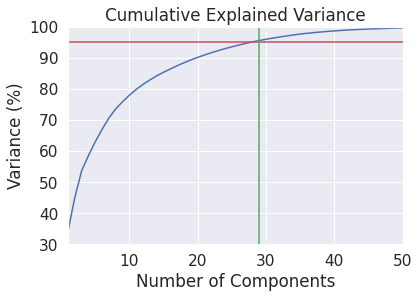

First 2 PC: 45.01753753484459


In [106]:
plt.figure()
plt.plot(range(1, 51), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Cumulative Explained Variance')
plt.xlim(1, 50)
plt.ylim(30, 100)
plt.axhline(y=95, color='r')
plt.axvline(x=29, color='g')
plt.show()
print(f'First 2 PC: {sum(pca.explained_variance_ratio_[0:2] * 100)}')

In [107]:
pca.explained_variance_ratio_ * 100

array([34.15935672, 10.85818082,  8.62946598,  4.91417943,  4.47544438,
        3.96647737,  3.68253211,  2.9224809 ,  2.3082046 ,  2.10311121,
        1.85645275,  1.63396623,  1.41163539,  1.33898024,  1.13270453,
        1.07134143,  1.03005283,  0.97529955,  0.88896444,  0.82786526,
        0.75942195,  0.74094444,  0.68608079,  0.6302052 ,  0.57496508,
        0.56423897,  0.52113293,  0.50389852,  0.43435816,  0.40921192,
        0.3804326 ,  0.34911844,  0.3323949 ,  0.3222393 ,  0.28970462,
        0.24461945,  0.22184103,  0.19356813,  0.18412989,  0.17169662,
        0.15029082,  0.13123313,  0.11989091,  0.10499203,  0.09353209,
        0.08425768,  0.07693804,  0.07223692,  0.06409979,  0.05784146])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PC1 = 34.1% variance', ylabel='PC2 = 10.9% variance'>

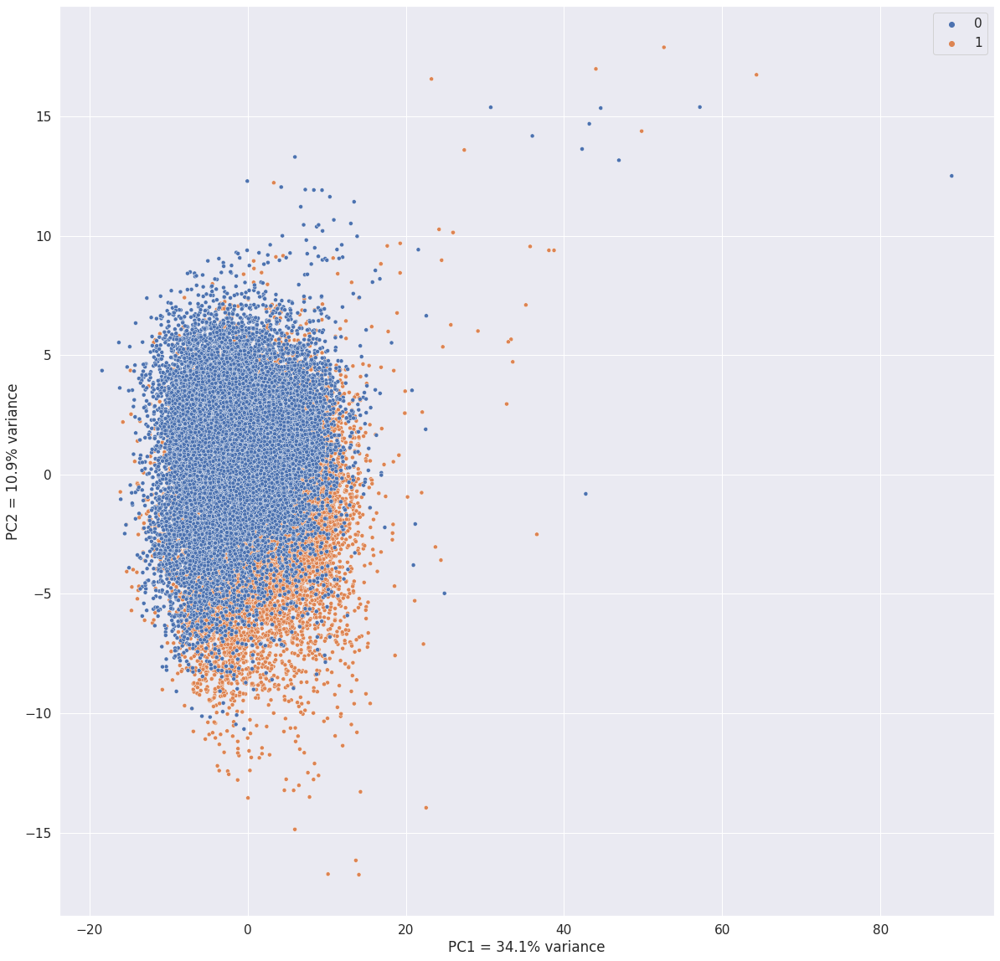

In [108]:
labels = dataset_des.y
plt.figure(figsize=(20, 20))
plt.xlabel('PC1 = 34.1% variance')
plt.ylabel('PC2 = 10.9% variance')
sns.scatterplot(
    df[:, 0], df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

The first two principal components explain 45% of the data variance.
To explain 95% of the variance, 29 principal components are required.

The PCA graph shows that our data does not distribute well along the first principal component which explains 34% of the variance. The is a separation along the second principal component, which explains 10% of the variance. In general, it is difficult to distinguish between active and inactive molecules.

### t-distributed Stochastic Neighbor Embedding (t-SNE)

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Dimension 1', ylabel='Dimension 2'>

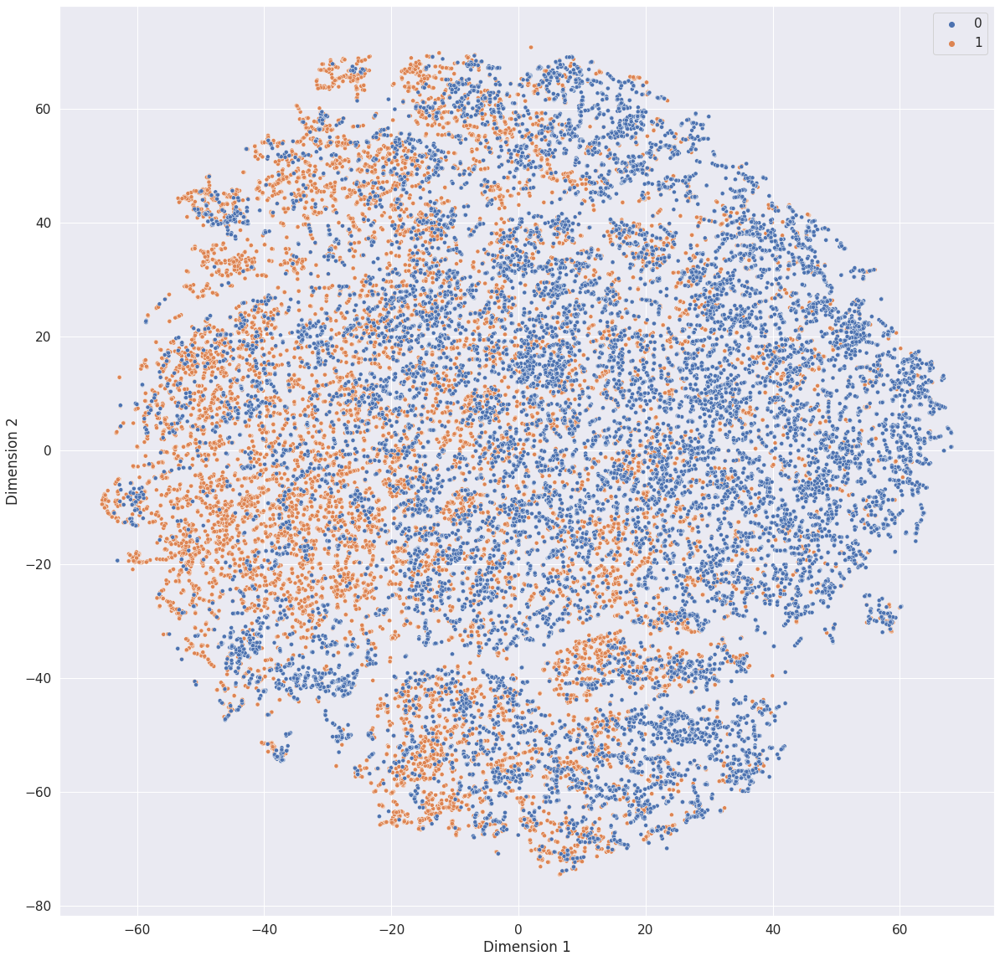

In [70]:
tsne = TSNE(n_components=2)
tsne_df = tsne.fit_transform(df[:, 0:29])
labels = dataset_des.y
plt.figure(figsize=(20, 20))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
sns.scatterplot(
    tsne_df[:, 0], tsne_df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

From the t-SNE graph, we observe a small separation of the data along the first dimension.

### k-Means

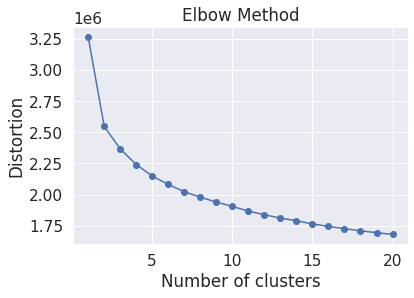

In [71]:
distortions = []
for i in range(1, 21):
    km = KMeans(
        n_clusters=i, init='k-means++',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(df)
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, 21), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [72]:
kmeans = KMeans(n_clusters=15)
kmeans_y = kmeans.fit_predict(df)

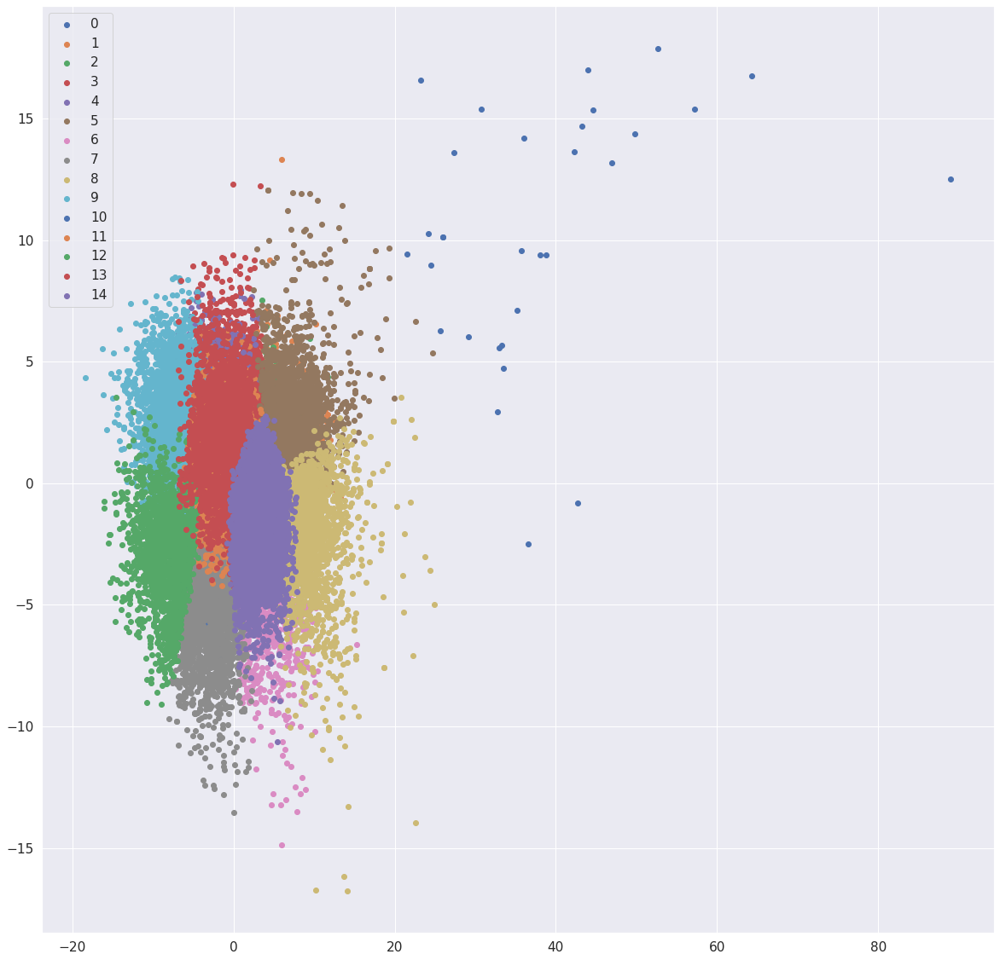

In [73]:
u_labels = np.unique(kmeans_y)
#plotting the results:
plt.figure(figsize=(20, 20))
for i in u_labels:
    plt.scatter(df[kmeans_y == i, 0], df[kmeans_y == i, 1], label=i)
plt.legend()
plt.show()

Accordingly to the k-Means graph, there is no clear separation between the clusters.

### Fingerprints

In [74]:
##Fazer Unsupervised para Fingerprints sendo que para os descritores não é necessário generate_similarities.
def generate_similarities(fps):
    similarities_list = []
    bv1 = DataStructs.ExplicitBitVect(fps.shape[1])

    new_fps = []
    for fp in fps:

        bv12 = copy.copy(bv1)
        for i, bit in enumerate(fp):
            if bit == 1:
               bv12.SetBit(i)
        new_fps.append(bv12)

    for i in range(0,1000):  # 2000
        remaining_fp = new_fps[:i] + new_fps[i+1:]
        similarities = DataStructs.BulkTanimotoSimilarity(new_fps[i], remaining_fp)
        similarities.insert(i,1)
        similarities_list.append(similarities)

    return np.transpose(np.array(similarities_list))

### MorganFingerprint

In [75]:
similarities = generate_similarities(dataset_morgan_fs)

### Principal Component Analysis (PCA)

In [76]:
pca = PCA(n_components=50)
df = pca.fit_transform(similarities)

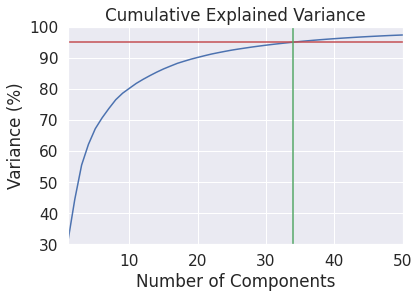

First 2 PC: 44.45694916430838


In [77]:
plt.figure()
plt.plot(range(1,51),np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Cumulative Explained Variance')
plt.xlim(1,50)
plt.ylim(30,100)
plt.axhline(y=95, color='r')
plt.axvline(x=34, color='g')
plt.show()
print(f'First 2 PC: {sum(pca.explained_variance_ratio_[0:2] * 100)}')

In [78]:
pca.explained_variance_ratio_ * 100

array([31.01790869, 13.43904048, 11.05703232,  6.66430222,  5.03420069,
        3.4984887 ,  3.03453737,  2.8084948 ,  2.08252263,  1.59618554,
        1.56877414,  1.30821439,  1.19984823,  1.12599616,  1.0285649 ,
        0.90312346,  0.88075204,  0.68635394,  0.65632185,  0.57614315,
        0.55033137,  0.52776511,  0.4469247 ,  0.4268442 ,  0.40421801,
        0.35009354,  0.32940397,  0.32437675,  0.29245803,  0.28521695,
        0.26375444,  0.24654387,  0.23526708,  0.22338626,  0.22228116,
        0.20228578,  0.193963  ,  0.17883958,  0.16854797,  0.15677548,
        0.15421736,  0.14153738,  0.13803816,  0.12823713,  0.12037689,
        0.11104309,  0.11083126,  0.10626528,  0.09147981,  0.09052978])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PC1 = 31.0% variance', ylabel='PC2 = 13.4% variance'>

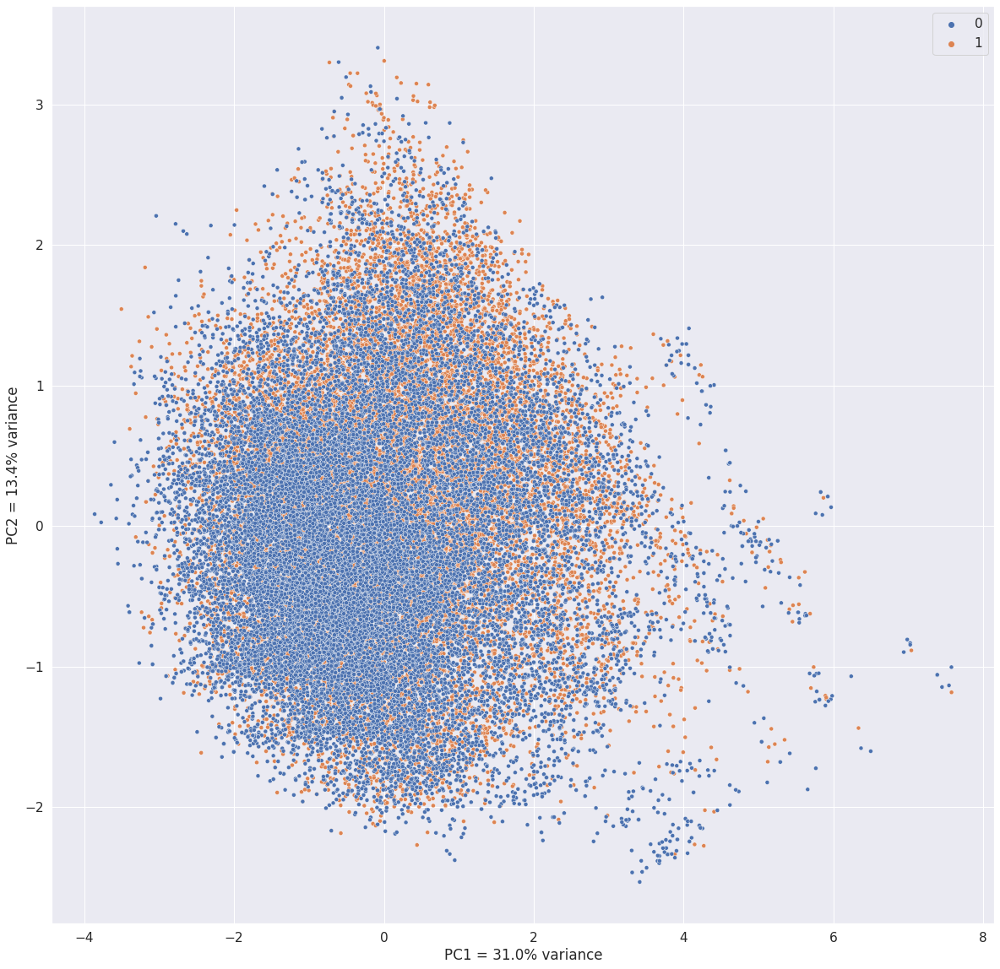

In [79]:
labels = dataset_morgan.y
plt.figure(figsize=(20, 20))
plt.xlabel('PC1 = 31.0% variance')
plt.ylabel('PC2 = 13.4% variance')
sns.scatterplot(
    df[:, 0], df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

The first two principal components explain 44% of the data variance.
To explain 95% of the variance, 34 principal components are required.

The PCA graph shows that our data does not distribute well along the first two principal component which explains 44% of the variance. In general, it is difficult to distinguish between active and inactive molecules.

### t-distributed Stochastic Neighbor Embedding (t-SNE)

In [80]:
tsne = TSNE(n_components=2)
tsne_df = tsne.fit_transform(df[:, 0:34])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Dimension 1', ylabel='Dimension 2'>

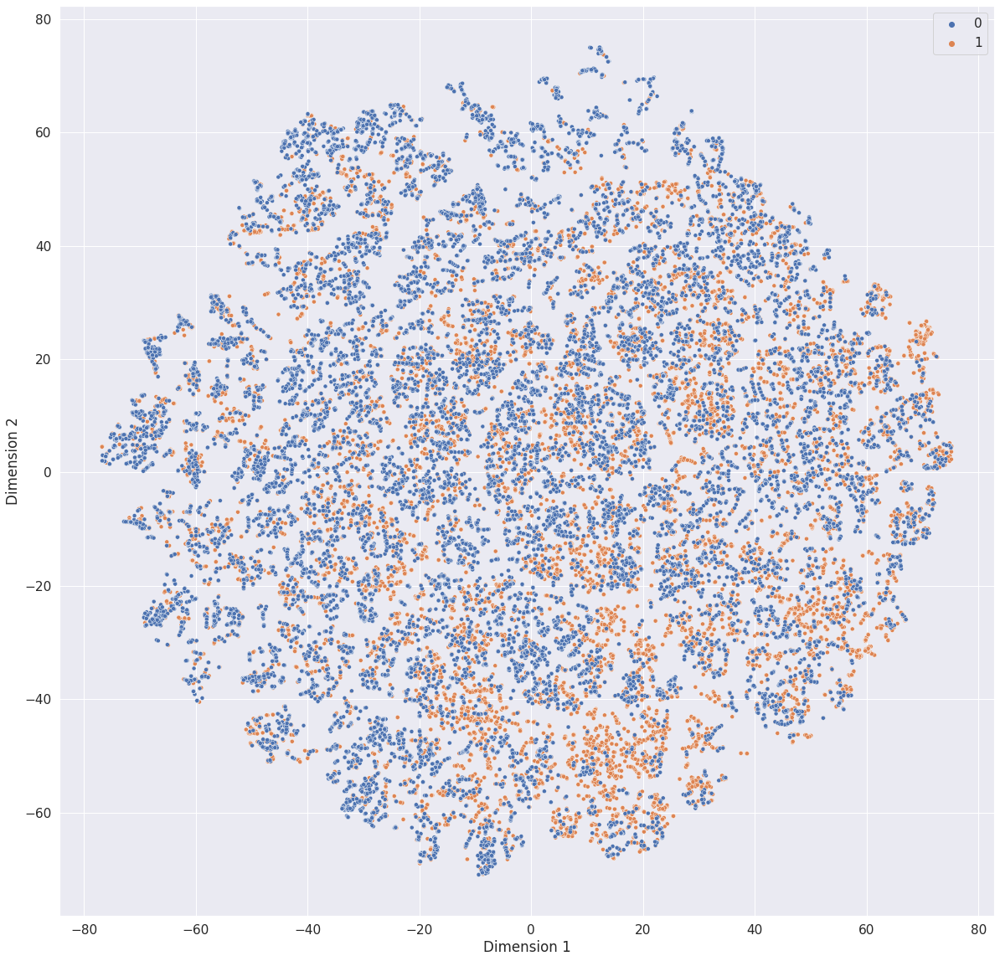

In [81]:
labels = dataset_morgan.y
plt.figure(figsize=(20, 20))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
sns.scatterplot(
    tsne_df[:, 0], tsne_df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

From the t-SNE graph, we observe that there is no clear separation between the dimensions.

### k-Means

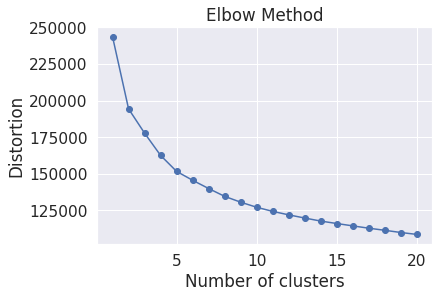

In [82]:
distortions = []
for i in range(1, 21):
    km = KMeans(
        n_clusters=i, init='k-means++',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(df)
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, 21), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

In [83]:
kmeans = KMeans(n_clusters=15)
kmeans_y = kmeans.fit_predict(df)

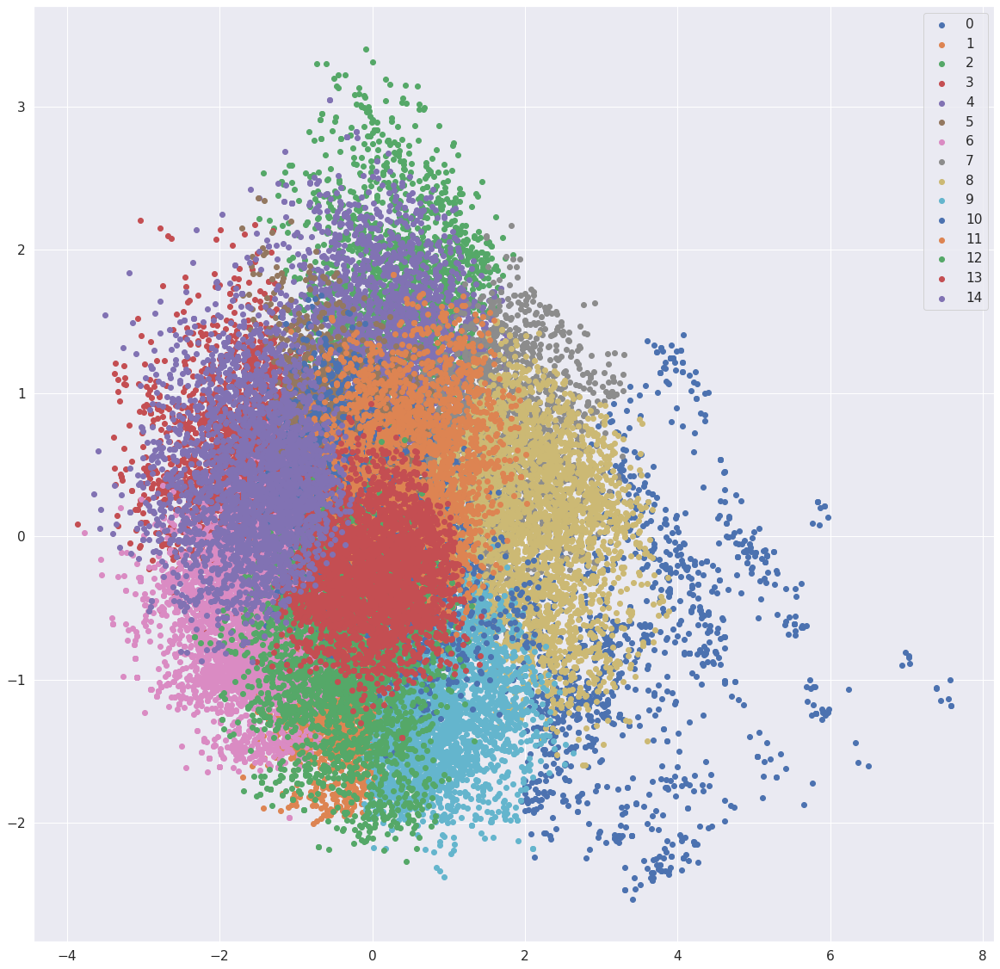

In [84]:
u_labels = np.unique(kmeans_y)

#plotting the results:
plt.figure(figsize=(20, 20))
for i in u_labels:
    plt.scatter(df[kmeans_y == i , 0] , df[kmeans_y == i , 1] , label = i)
plt.legend()
plt.show()

Accordingly to the k-Means graph, there is no clear separation between the clusters.

### RDKFingerprint

In [85]:
similarities = generate_similarities(dataset_rdk_fs)

### Principal Component Analysis (PCA)

In [86]:
pca = PCA(n_components=50)
df = pca.fit_transform(similarities)

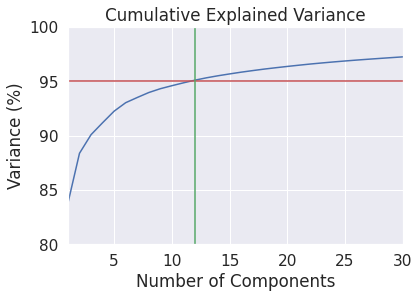

First 2 PC: 88.37294871885493


In [87]:
plt.figure()
plt.plot(range(1,51),np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Cumulative Explained Variance')
plt.xlim(1,30)
plt.ylim(80,100)
plt.axhline(y=95, color='r')
plt.axvline(x=12, color='g')
plt.show()
print(f'First 2 PC: {sum(pca.explained_variance_ratio_[0:2] * 100)}')

In [88]:
pca.explained_variance_ratio_ * 100

array([8.37960271e+01, 4.57692164e+00, 1.70992434e+00, 1.09924373e+00,
       1.06379234e+00, 7.78665169e-01, 4.77012290e-01, 4.56906540e-01,
       3.51816654e-01, 2.76778000e-01, 2.63466320e-01, 2.47170690e-01,
       2.15822517e-01, 1.88510879e-01, 1.68492439e-01, 1.61231721e-01,
       1.44970726e-01, 1.38972558e-01, 1.24871623e-01, 1.18975656e-01,
       1.13736298e-01, 1.08795273e-01, 9.78132272e-02, 9.42523761e-02,
       8.71225012e-02, 8.36450962e-02, 7.69550284e-02, 7.41276170e-02,
       7.34402783e-02, 7.06443669e-02, 6.75008673e-02, 6.53876353e-02,
       6.02467403e-02, 5.90222629e-02, 5.84889864e-02, 5.59903204e-02,
       5.43872872e-02, 5.14959814e-02, 4.98503839e-02, 4.90150692e-02,
       4.71434697e-02, 4.58613240e-02, 4.33434076e-02, 4.32594467e-02,
       4.18468717e-02, 4.00220044e-02, 3.88943280e-02, 3.83781608e-02,
       3.71012100e-02, 3.63622949e-02])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PC1 = 83.8% variance', ylabel='PC2 = 4.6% variance'>

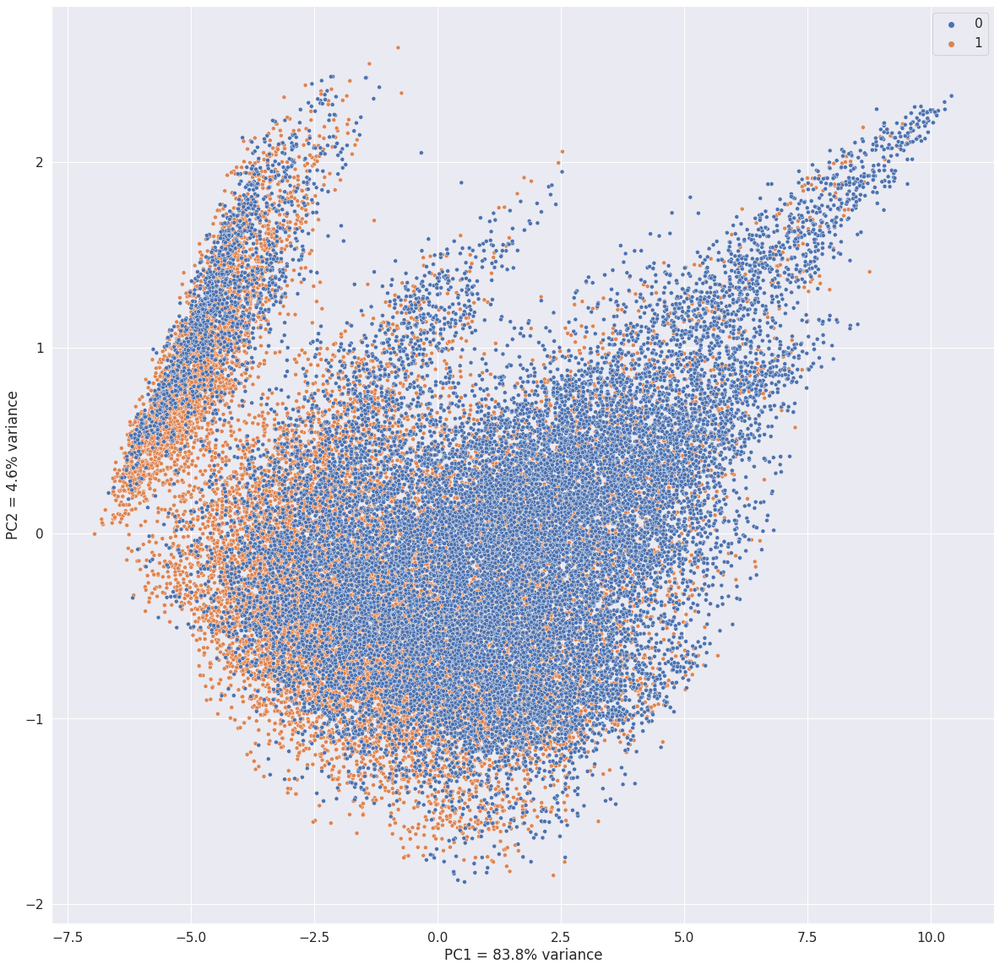

In [89]:
labels = dataset_rdk.y
plt.figure(figsize=(20, 20))
plt.xlabel('PC1 = 83.8% variance')
plt.ylabel('PC2 = 4.6% variance')
sns.scatterplot(
    df[:, 0], df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

The first two principal components explain 88% of the data variance.
To explain 95% of the variance, 12 principal components are required.

The PCA graph shows that our data has a small seperation along the first principal component which explains 83% of the variance. There is also a small separation of the data along the second principal component which explains 4% of the variance. Even though, the first two principal components explains 88% of the variance, it is still difficult to distinguish the molecules accordingly to their activity.

### t-distributed Stochastic Neighbor Embedding (t-SNE)

In [90]:
tsne = TSNE()
tsne_df = tsne.fit_transform(df[:, 0:12])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Dimension 1', ylabel='Dimension 2'>

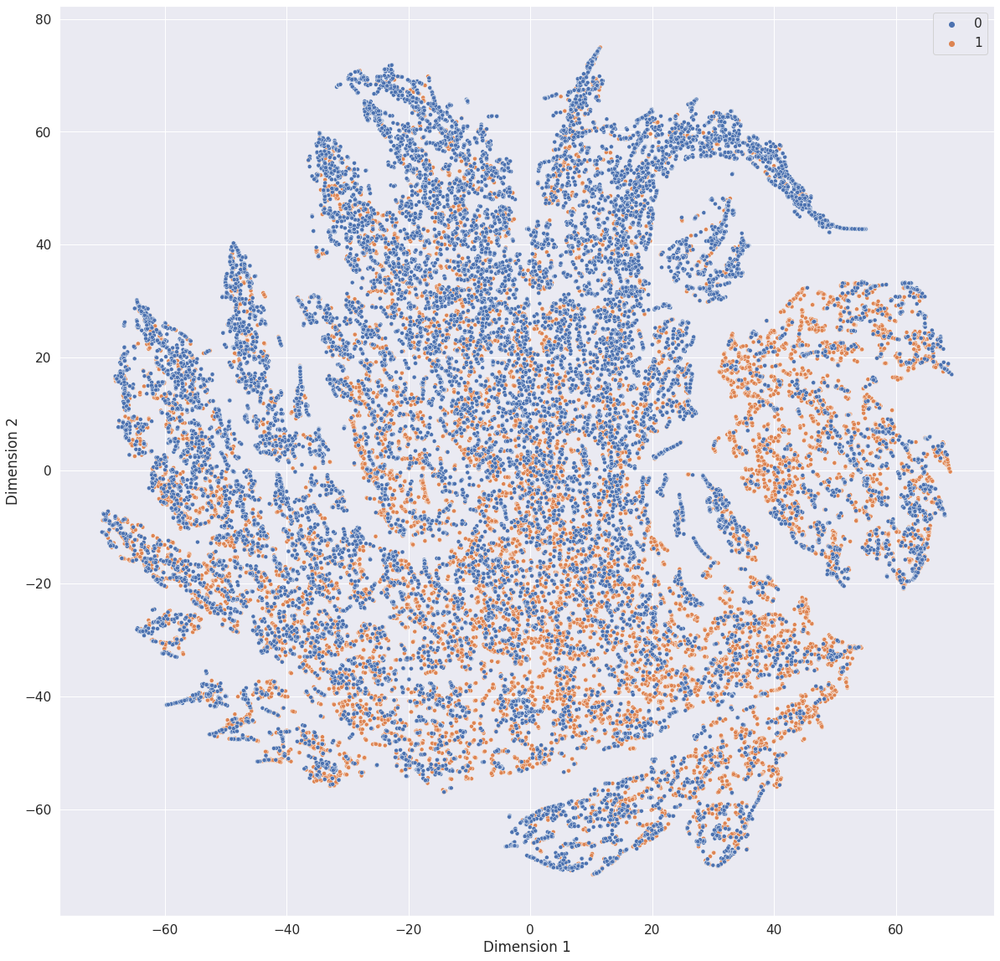

In [91]:
labels = dataset_rdk.y
plt.figure(figsize=(20, 20))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
sns.scatterplot(
    tsne_df[:, 0], tsne_df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

From the t-SNE graph, we observe that there is a small separation along the first dimension.

### k-Means

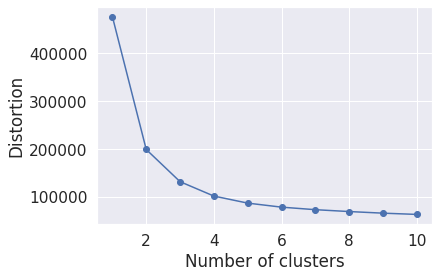

In [92]:
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i, init='k-means++',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(df)
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

In [93]:
kmeans = KMeans(n_clusters=8)
kmeans_y = kmeans.fit_predict(df)

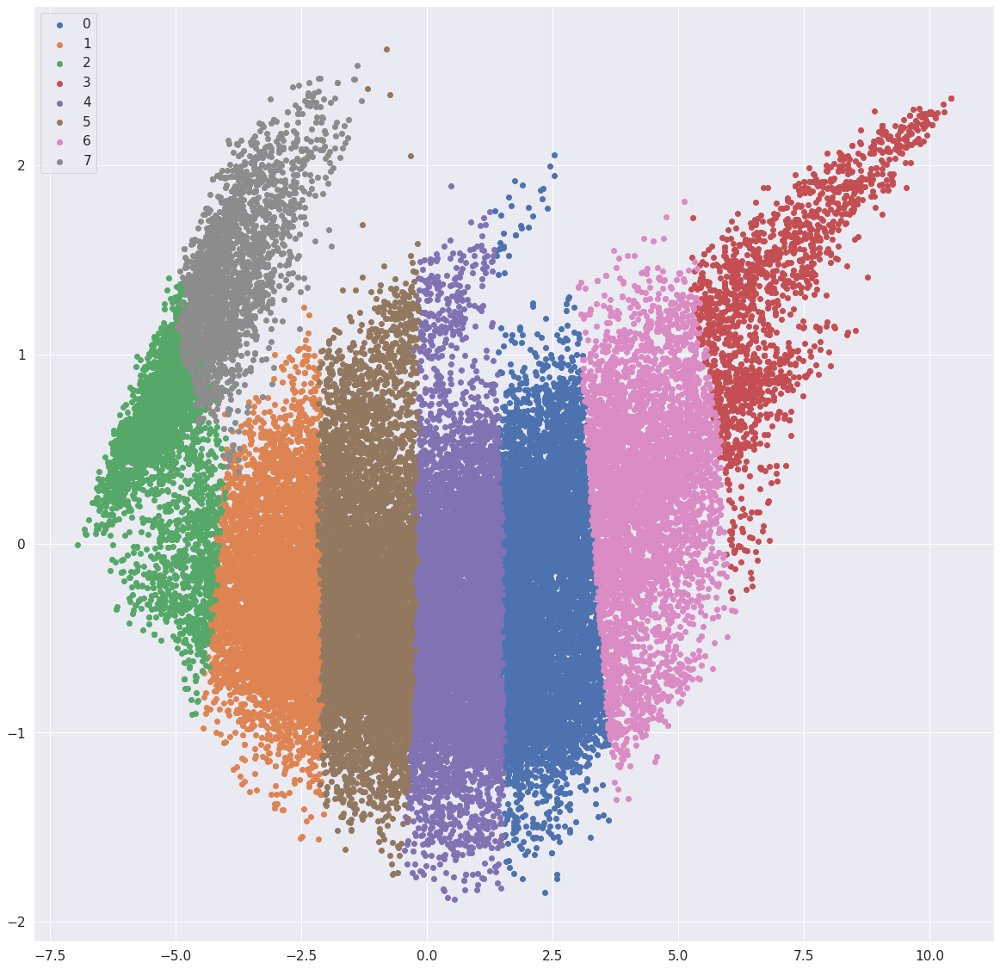

In [94]:
u_labels = np.unique(kmeans_y)

#plotting the results:
plt.figure(figsize=(20, 20))
for i in u_labels:
    plt.scatter(df[kmeans_y == i, 0], df[kmeans_y == i, 1], label=i)
plt.legend()
plt.show()

Accordingly to the k-Means graph, there is a clear separation between the clusters.

### MACCSkeysFingerprint

In [95]:
similarities = generate_similarities(dataset_macc_fs)

### Principal Component Analysis (PCA)

In [96]:
pca = PCA(n_components=50)
df = pca.fit_transform(similarities)

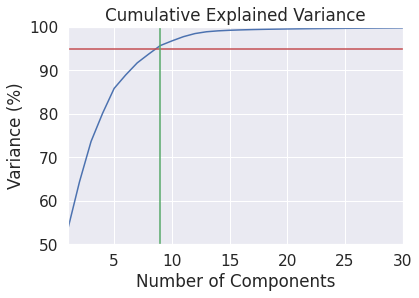

First 2 PC: 64.37179938443107


In [97]:
plt.figure()
plt.plot(range(1, 51), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Cumulative Explained Variance')
plt.xlim(1, 30)
plt.ylim(50, 100)
plt.axhline(y=95, color='r')
plt.axvline(x=9, color='g')
plt.show()
print(f'First 2 PC: {sum(pca.explained_variance_ratio_[0:2] * 100)}')

In [98]:
pca.explained_variance_ratio_ * 100

array([5.35970606e+01, 1.07747388e+01, 9.26637156e+00, 6.48490997e+00,
       5.71944514e+00, 3.09192168e+00, 2.78364524e+00, 2.03832959e+00,
       1.94546879e+00, 1.06289021e+00, 9.76422365e-01, 7.16773394e-01,
       4.15117147e-01, 2.11048891e-01, 1.30029930e-01, 8.98604606e-02,
       7.32852440e-02, 5.69517021e-02, 4.72448830e-02, 4.01492484e-02,
       3.64908088e-02, 3.13114058e-02, 2.70101476e-02, 2.36580487e-02,
       2.29928311e-02, 2.19273051e-02, 2.02398352e-02, 1.92938182e-02,
       1.72764985e-02, 1.61619204e-02, 1.45834199e-02, 1.30121950e-02,
       1.22588989e-02, 1.08347059e-02, 1.04836847e-02, 9.78210551e-03,
       9.31465109e-03, 8.90526326e-03, 8.47199152e-03, 7.36837103e-03,
       6.90393598e-03, 6.66973385e-03, 6.21613205e-03, 5.47492023e-03,
       5.30385312e-03, 5.11585441e-03, 4.79737629e-03, 4.49700742e-03,
       4.35225617e-03, 4.08300993e-03])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PC1 = 53.6% variance', ylabel='PC2 = 10.8% variance'>

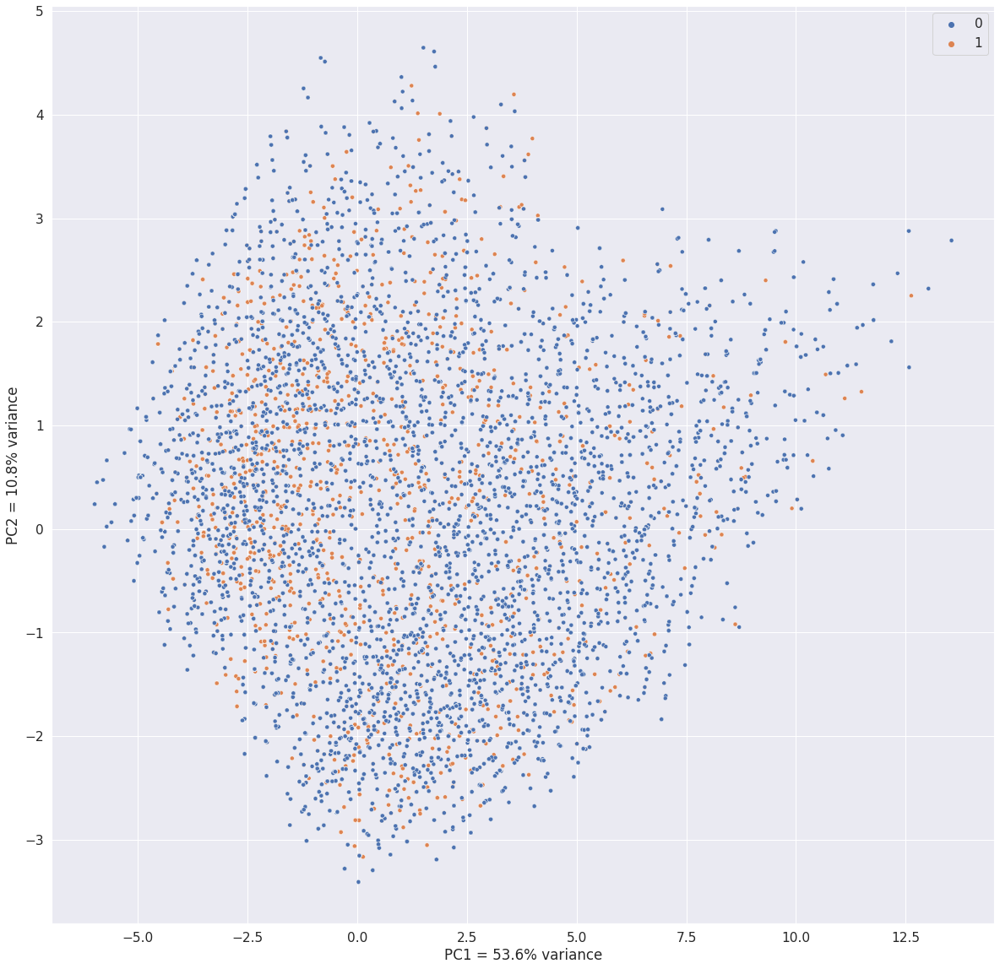

In [99]:
labels = dataset_macc.y
plt.figure(figsize=(20, 20))
plt.xlabel('PC1 = 53.6% variance')
plt.ylabel('PC2 = 10.8% variance')
sns.scatterplot(
    df[:, 0], df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

The first two principal components explain 64% of the data variance.
To explain 95% of the variance, 9 principal components are required.

The PCA graph shows that our data does not distribute well along the first two principal component which explains 64% of the variance. In general, it is difficult to distinguish between active and inactive molecules.

### t-distributed Stochastic Neighbor Embedding (t-SNE)

In [100]:
tsne = TSNE()
tsne_df = tsne.fit_transform(df[:, 0:9])

/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


/home/laptop16/anaconda3/envs/smiles/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Dimension 1', ylabel='Dimension 2'>

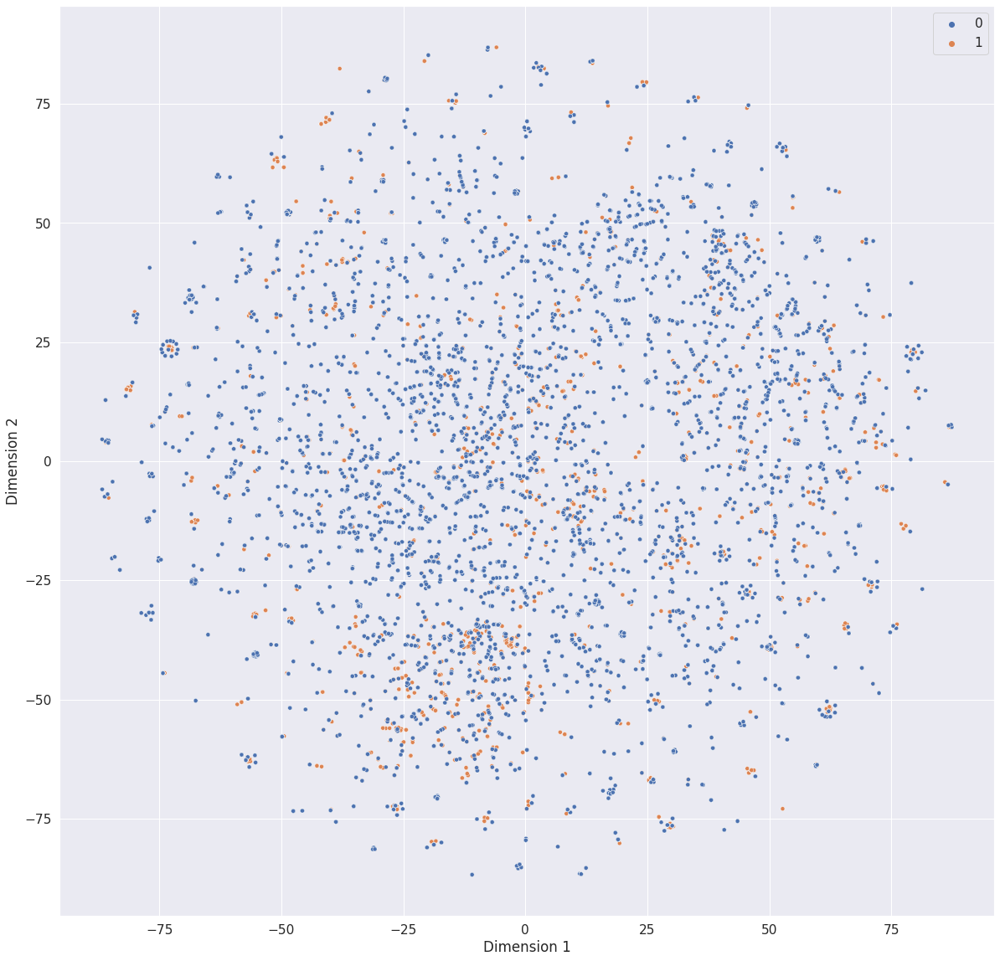

In [101]:
labels = dataset_macc.y
plt.figure(figsize=(20, 20))
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
sns.scatterplot(
    tsne_df[:, 0], tsne_df[:, 1],
    hue=labels,
    palette=sns.color_palette("deep", 2),
    legend="full",
    s=25)

From the t-SNE graph, we observe that there is no separation of the data along the two dimensions.


### k-Means

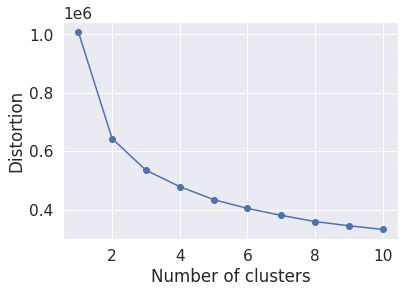

In [102]:
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i, init='k-means++',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(df)
    distortions.append(km.inertia_)

# plot
plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

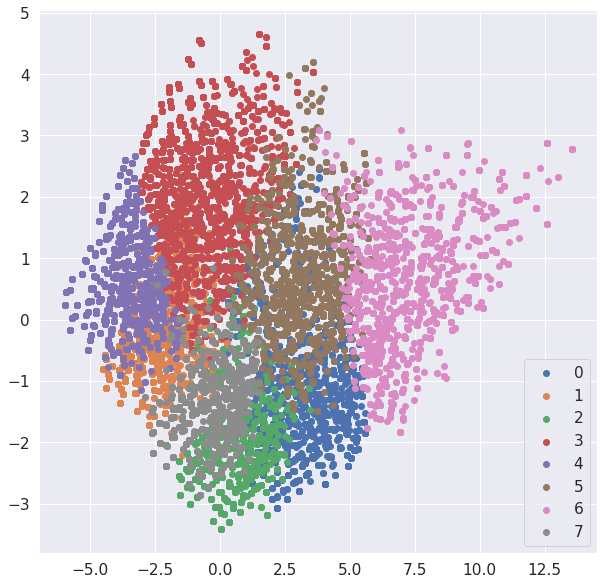

In [103]:
kmeans = KMeans(n_clusters=8)
kmeans_y = kmeans.fit_predict(df)
u_labels = np.unique(kmeans_y)

#plotting the results:
plt.figure(figsize=(10, 10))
for i in u_labels:
    plt.scatter(df[kmeans_y == i, 0], df[kmeans_y == i, 1], label=i)
plt.legend()
plt.show()

Accordingly to the k-Means graph, there is no clear separation between the clusters.

## Conclusion
From the TDP1 activity dataset, we extracted the SMILE and activity of all the molecules. Using the SMILE we were able to obtain two types of features: descriptors and fingerprints. These were related with the active state of the corresponding molecule. These two types of features were examined using PCA and clustering. However, these analysis were inconclusive. Therefore, it is difficult to distinguish the molecules according to their active state. Nonetheless, we think that it is possible to proceed to supervised learning using the descriptors and the RDKFingerprint technique (being this the one that achieved the better results). We trust that we can obtain better results in the classification of the molecules's active state.